# **Updating Packages**

In [ ]:
!pip uninstall tensorflow keras -y

Found existing installation: tensorflow 2.18.0
Uninstalling tensorflow-2.18.0:
  Successfully uninstalled tensorflow-2.18.0
Found existing installation: keras 3.8.0
Uninstalling keras-3.8.0:
  Successfully uninstalled keras-3.8.0


In [ ]:
!pip install tensorflow --upgrade
!pip install keras --upgrade
!pip install keras-hub --upgrade

!pip install tf2onnx
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 644.9/644.9 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 54.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 64.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 90.8 MB/s eta 0:00:00
  Attempting uninstall: ml-dtypes
    Found existing installation: ml-dtypes 0.4.1
    Uninstalling ml-dtypes-0.4.1:
      Successfully uninstalled ml-dtypes-0.4.1
  Attempting uninstall: tensorboard
    Found existing installation: tensorboard 2.18.0
    Uninstalling tensorboard-2.18.0:
      Successfully uninstalled tensorboard-2.18.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.18.1 requires tensorflow<2.19,>=2.18.0, but you have tensorflow 2.19.0 which is incompatible.
tf-keras 2.18.0 requires tensorflow<2.19,>=2.18, but you have t

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.0/16.0 MB 95.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 8.2 MB/s eta 0:00:00


# **Downloading Kaggle Dataset**

In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
alessandrasala79_ai_vs_human_generated_dataset_path = kagglehub.dataset_download('alessandrasala79/ai-vs-human-generated-dataset')

print('Data source import complete.')


Data source import complete.


In [ ]:
alessandrasala79_ai_vs_human_generated_dataset_path = alessandrasala79_ai_vs_human_generated_dataset_path + '/'

Dataset_Path = alessandrasala79_ai_vs_human_generated_dataset_path

# **Imports**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from PIL import Image
import shutil
import os
import glob
import shutil
import csv
import random as rn
import time
from tqdm import tqdm

import tensorflow as tf
import keras
import cv2
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, ConfusionMatrixDisplay, roc_auc_score, accuracy_score, f1_score, balanced_accuracy_score, fbeta_score, confusion_matrix, classification_report
from sklearn.metrics import RocCurveDisplay, roc_curve, PrecisionRecallDisplay, precision_recall_curve, average_precision_score, det_curve, DetCurveDisplay

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array
from tensorflow.keras import layers , models, optimizers, Model
from keras.models import Sequential, Model
from keras.layers import *
from keras import regularizers
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from tensorflow.keras.utils import plot_model

import tf2onnx
import onnxruntime

In [ ]:
def set_reproducible_seed(seed=0):
    """
    Set random seeds and configure TensorFlow for reproducible behavior.
    """
    # Ensure reproducible hashing
    os.environ['PYTHONHASHSEED'] = str(seed)

    # Set seeds for Python, NumPy, and TensorFlow
    rn.seed(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)
    keras.utils.set_random_seed(seed)

    # Enable operation-level determinism (TF 2.9+)
    tf.config.experimental.enable_op_determinism()

    # Force deterministic GPU behavior where possible
    os.environ["TF_DETERMINISTIC_OPS"] = "1"
    os.environ["TF_CUDNN_DETERMINISTIC"] = "1"

    # Limit potential multithreading variability
    os.environ["OMP_NUM_THREADS"] = "1"
    os.environ["TF_NUM_INTEROP_THREADS"] = "1"
    os.environ["TF_NUM_INTRAOP_THREADS"] = "1"

    print(f"Random seed set to: {seed}")

# Set the seed (do this at the very beginning of your script)
set_reproducible_seed(0)

Random seed set to: 0


In [ ]:
Classes_Labels = ['Human', 'AI'] # Human = 0, AI = 1

## **Utility Functions**

In [ ]:
def show_class_images(df, label, rows=2, cols=5, image_column="file_name", title=""):
    """
    Display images from a specific class in a grid format.
    """

    # Get list of image paths for the given class
    image_paths = df[df["label"] == label][image_column].tolist()

    if len(image_paths) == 0:
        print(f"No images found for label: {label}")
        return

    total_images = rows * cols  # Calculate the total number of images to display
    selected_images = rn.sample(image_paths, min(total_images, len(image_paths)))  # Ensure we don’t exceed available images

    plt.figure(figsize=(cols * 3, rows * 3))

    for i, img_path in enumerate(selected_images):
        img = Image.open(img_path)  # Open image
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
def show_test_images(df, rows=2, cols=5, image_column="file_path", title="Test Images"):
    """
    Display a grid of test images in a grid format.
    """

    total_images = rows * cols
    # Randomly sample image file paths from the dataframe
    sample_images = rn.sample(df[image_column].tolist(), min(total_images, len(df)))

    plt.figure(figsize=(cols * 3, rows * 3))

    for i, img_path in enumerate(sample_images):
        img = Image.open(img_path)  # Open image

        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Test Image {i + 1}")

    plt.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

In [ ]:
def compare_classes_images(df, rows=5, image_column="file_name", title="AI vs Human-Generated Images"):
    """
    Display classes images side by side in two aligned columns.
    """

    # Separate AI-generated and human-created images
    ai_images = df[df["label"] == 1][image_column].tolist()
    human_images = df[df["label"] == 0][image_column].tolist()

    # Determine the number of image pairs to display
    num_pairs = min(rows, len(ai_images), len(human_images))  # Ensure enough images exist

    if num_pairs == 0:
        print("Not enough images available for both classes.")
        return

    # Randomly sample images for comparison
    ai_sample = rn.sample(ai_images, num_pairs)
    human_sample = rn.sample(human_images, num_pairs)

    # Create the figure
    fig, axes = plt.subplots(nrows=num_pairs, ncols=2, figsize=(10, num_pairs * 3))

    for i in range(num_pairs):
        # Human-created image (Left Column)
        img_human = Image.open(human_sample[i])
        axes[i, 0].imshow(img_human)
        axes[i, 0].axis("off")
        axes[i, 0].set_title("Human-Generated", fontsize=12)

        # AI-generated image (Right Column)
        img_ai = Image.open(ai_sample[i])
        axes[i, 1].imshow(img_ai)
        axes[i, 1].axis("off")
        axes[i, 1].set_title("AI-Generated", fontsize=12)

    # Set overall title
    fig.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

In [ ]:
def make_classification_plots(y_true, model_preds_probs, threshold, title):

  plt.style.use('default')
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  model_preds = np.where(model_preds_probs > threshold, 1, 0)
  # 1 : Summary Metrics
  accuracy = accuracy_score(y_true, model_preds) # % positive out of all predicted positives
  balanced_accuracy = balanced_accuracy_score(y_true, model_preds)
  precision = precision_score(y_true, model_preds, average='weighted') # % positive out of all predicted positives
  recall =  recall_score(y_true, model_preds, average='weighted') # % positive out of all supposed to be positives
  f1 = f1_score(y_true, model_preds, average='weighted')
  fbeta = fbeta_score(y_true, model_preds, average='weighted', beta=2)
  auc = roc_auc_score(y_true, model_preds_probs)
  avgPR = average_precision_score(y_true, model_preds_probs)
  stats_summary = '[Metrics Summary]\nAccuracy = {:.2%} | Balanced Accuracy = {:.2%} | Precision = {:.2%} | Recall = {:.2%} | F1-Score = {:.2%} | F-Beta Score = {:.2%} | AUC Score = {:.2%} | Average Precision = {:.2%}'.format(accuracy, balanced_accuracy , precision, recall, f1, fbeta, auc, avgPR)
  print(stats_summary)

  # 2 : Confusion Matrix
  ConfusionMatrixDisplay.from_predictions(y_true, model_preds, ax=axes[0])
  axes[0].set_title("Confusion Matrix")
  axes[0].set_xticklabels(Classes_Labels)
  axes[0].set_yticklabels(Classes_Labels)

  # 3 : Normalized Confusion Matrix
  ConfusionMatrixDisplay.from_predictions(y_true, model_preds, ax=axes[1], normalize="true", values_format=".0%")
  axes[1].set_title("Normalized Confusion Matrix")

  # 4 : Classification Report
  class_report_df = classification_report(y_true, model_preds, target_names=Classes_Labels, output_dict=True)
  class_report_df = pd.DataFrame(class_report_df).T
  class_report_df['support'] = class_report_df['support'].astype(int)
  class_report_df.drop(index='accuracy', inplace=True)
  class_report_df[['precision', 'recall', 'f1-score']] = round(class_report_df[['precision', 'recall', 'f1-score']] * 100,2)
  sns.heatmap(class_report_df, annot=True, fmt=".2f", cmap=sns.color_palette("crest", as_cmap=True), annot_kws={"size": 12},
            linewidths= 1, square=True, ax = axes[2],
            )
  plt.yticks(rotation=0)
  axes[2].set_title("Classification Report")


  fig.suptitle(f"{title} Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  class_report = classification_report(y_true, model_preds, target_names= Classes_Labels)
  print('\n', f"{title} Classification Report: \n {class_report}")


  plt.style.use('ggplot')

In [ ]:
epsilon = np.finfo(np.float32).eps

def make_binary_classification_plots(y_true, model_preds_probs, threshold, title):

  # 1 : Summary Metrics
  model_preds = np.where(model_preds_probs > threshold, 1, 0)
  precision = precision_score(y_true, model_preds)
  recall =  recall_score(y_true, model_preds)
  f1 = f1_score(y_true, model_preds)
  fbeta = fbeta_score(y_true, model_preds, beta=2)
  auc = roc_auc_score(y_true, model_preds_probs, average='micro')
  stats_summary = '[Positive Class Metrics Summary]\nPrecision = {:.2%} | Recall = {:.2%} | F1-Score = {:.2%} | F-Beta Score = {:.2%} | AUC Micro Score = {:.2%}'.format(precision, recall, f1, fbeta, auc)
  print(stats_summary)

  plt.style.use('ggplot')
  fig, axes = plt.subplots(1, 3, figsize=(15, 5))

  # 1 : ROC CURVE
  axes[0].plot([0, 1], [0, 1], 'k--')
  fpr, tpr, thresholds = roc_curve(y_true, model_preds_probs, pos_label=1)
  aucMacro = roc_auc_score(y_true, model_preds_probs)
  aucWeighted = roc_auc_score(y_true, model_preds_probs, average='weighted')
  axes[0].plot(fpr, tpr, color='orange', label=f'(AUC Macro = {round(aucMacro*100,2)}%)')
  axes[0].plot(fpr, tpr, '--', color='orange', label=f'(AUC Weighted = {round(aucWeighted*100,2)}%)')
  axes[0].set_title('ROC Curve')
  axes[0].set_xlabel('False Positive Rate', size=14)
  axes[0].set_ylabel('True Positive Rate', size=14)
  axes[0].legend(loc='best')

  # 2 : Precision Recall Curve
  precisions, recalls, thresholds = precision_recall_curve(y_true, model_preds_probs)
  avgPR = average_precision_score(y_true, model_preds_probs)
  # Plot the PR curve
  axes[1].plot(recalls, precisions, color='b', label='Binary PR Curve')
  axes[1].fill_between(recalls, precisions, alpha=0.2, color='b')
  axes[1].hlines(avgPR, 0, 1.0, "r", "dotted", label=f"(Avg PR = {round(avgPR*100,2)}%)")
  # Find the index of the threshold that gives the best precision-recall balance
  f1score = 2 * (precisions * recalls) / (precisions + recalls + epsilon)
  best_f1_idx = np.argmax(f1score)
  best_precision = precisions[best_f1_idx]
  best_recall = recalls[best_f1_idx]
  best_threshold = thresholds[best_f1_idx]
  # Draw the point for the best precision and recall
  axes[1].scatter(best_recall, best_precision, color='orange', marker='v', s=50, zorder=10,
                  label=f'Tradeoff Threshold = {round(best_threshold*100,2)}%\n Precision = {round(best_precision*100,2)}%, Recall = {round(best_recall*100,2)}%')
  axes[1].set_xlabel('Recall', size=14)
  axes[1].set_ylabel('Precision', size=14)
  axes[1].set_title("Precision Recall Curve")
  axes[1].legend(loc='best')

  # 3 : Decision Threshold
  axes[2].plot(thresholds, f1score[:-1], "g-", label="F1", linewidth=2, alpha=0.5)
  axes[2].plot(thresholds, precisions[:-1], "b-", label="Precision", linewidth=2, alpha=0.5)
  axes[2].plot(thresholds, recalls[:-1], "--", color='orange', label="Recall",linewidth=2)
  axes[2].vlines(threshold, 0, 1.0, "k", "dotted", label="Threshold")
  axes[2].vlines(best_threshold, 0, 1.0, "r", "dotted", label="Tradeoff Threshold")
  axes[2].set_xlabel('Threshold', size=14)
  axes[2].legend(loc='best')
  axes[2].set_title('Decision Threshold')

  fig.suptitle(f"{title} Binary Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  plt.style.use('default')

  return best_threshold

In [ ]:
def make_binary_threshold_plots(y_true, model_preds_probs, threshold, title):

  # 1 : Summary Metrics
  model_preds = np.where(model_preds_probs > threshold, 1, 0)
  weightsMetrics = ['samples', 'micro', 'macro', 'weighted']
  aucScores = []
  avgPrScores = []

  for weight in weightsMetrics:
    aucScores.append(round((roc_auc_score(y_true, model_preds_probs, average=weight)*100),2))
    avgPrScores.append(round((average_precision_score(y_true, model_preds_probs, average=weight)*100),2))

  results_df = pd.DataFrame([aucScores,avgPrScores], columns=weightsMetrics, index = ['AUC','mAP'])
  display(results_df.style.background_gradient(cmap='Blues',axis=1))

  plt.style.use('ggplot')
  fig, axes = plt.subplots(1, 2, figsize=(15, 6))

  # 2 : Decision Threshold

  def f_beta_score(precision, recall, beta = 2):
    numerator = (1 + beta**2) * (precision * recall)
    denominator = (beta**2 * precision) + recall + epsilon
    f_beta = numerator / denominator
    return f_beta

  # Find the index of the threshold that gives the best precision-recall balance
  precisions, recalls, thresholds = precision_recall_curve(y_true, model_preds_probs)
  fbeta = f_beta_score(precisions, recalls, beta=2)
  best_fbeta_idx = np.argmax(fbeta)
  best_precision = precisions[best_fbeta_idx]
  best_recall = recalls[best_fbeta_idx]
  best_threshold = thresholds[best_fbeta_idx]

  axes[0].plot(thresholds, fbeta[:-1], "g-", label="F2-Beta Score", linewidth=2, alpha=0.5)
  axes[0].plot(thresholds, precisions[:-1], "b-", label="Precision", linewidth=2, alpha=0.5)
  axes[0].plot(thresholds, recalls[:-1], "--", color='orange', label="Recall",linewidth=2)
  axes[0].vlines(threshold, 0, 1.0, "k", "dotted", label="Threshold")
  axes[0].vlines(best_threshold, 0, 1.0, "r", "dotted", label="Tradeoff Threshold")
  axes[0].set_xlabel('Threshold', size=14)
  axes[0].legend(loc='best')
  axes[0].set_title(f'Recall Tradeoff Threshold = {round(best_threshold*100,2)}%\n Precision = {round(best_precision*100,2)}%, Recall = {round(best_recall*100,2)}%')


  # 3 : Detection Error Tradeoff
  fpr, fnr, _ = det_curve(y_true, model_preds_probs)
  DetCurveDisplay.from_predictions(y_true, model_preds_probs, ax=axes[1], name=title)
  axes[1].set_title("Detection Error Tradeoff")

  fig.suptitle(f"{title} Decision Threshold Metrics", fontsize=20, fontweight='bold')
  plt.tight_layout()
  plt.show()

  plt.style.use('default')

  return best_threshold

In [ ]:
def plot_history_curves(history):
  """
  Plot Model Accuracy and Loss History during Training.
  """
  loss = history.history["loss"]
  val_loss = history.history["val_loss"]

  accuracy = history.history["accuracy"]
  val_accuracy = history.history["val_accuracy"]

  epochs = range(len(history.history["loss"]))

  plt.figure(figsize=(15,5))
  plt.style.use('ggplot')

  #plot loss
  plt.subplot(1, 2, 1)
  plt.plot(epochs, loss, 'bo-' , label = "TrainL oss")
  plt.plot(epochs, val_loss, 'o-' , color='orange', label = "Val Loss")
  plt.title("Loss")
  plt.xlabel("epochs")
  plt.legend()

  #plot accuracy
  plt.subplot(1, 2, 2)
  plt.plot(epochs, accuracy, 'bo-' , label = "Train Acc")
  plt.plot(epochs, val_accuracy, 'o-' , color='orange' , label = "Val Acc")
  plt.title("Accuracy")
  plt.xlabel("epochs")
  plt.legend()

  plt.style.use('default')

  #plt.tight_layout()

In [ ]:
def display_random_predictions(test_generator, model, Classes_Labels, rows=2, cols=5, decision_threshold=0.5):
    """
    Display a grid of randomly selected images from a random batch of the test generator with their true and predicted labels,
    confidence percentages, and inference time for each image. and total infrence time for all images.
    """
    total_images = rows * cols

    # Randomly select a batch from the test generator.
    random_batch_index = np.random.randint(0, len(test_generator))

    batch_images, batch_labels = test_generator[random_batch_index]

    # Randomly select total_images indices from that batch without replacement.
    random_img_indices = np.random.choice(batch_images.shape[0], total_images, replace=False)

    # Create subplots grid.
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 3, rows * 4),
                             subplot_kw={'xticks': [], 'yticks': []})
    axes = axes.flatten()

    total_inference_time = 0.0

    for i, ax in enumerate(axes):
        # Retrieve the image and its true label.
        random_img = batch_images[random_img_indices[i]]
        true_label = int(batch_labels[random_img_indices[i]])

        # Measure inference time.
        start_time = time.perf_counter()
        pred_prob = model.predict(tf.expand_dims(random_img, axis=0), verbose=0)
        end_time = time.perf_counter()
        inference_time = end_time - start_time  # in seconds
        total_inference_time += inference_time

        # Use decision threshold for binary classification.
        if pred_prob[0][0] >= decision_threshold:
            predicted_label = 1
            confidence = pred_prob[0][0] * 100
        else:
            predicted_label = 0
            confidence = (1 - pred_prob[0][0]) * 100

        # Format the confidence to two decimal places.
        confidence_str = f"{confidence:.2f}"
        # Convert inference time to milliseconds for display.
        inference_time_ms = inference_time * 1000

        # Create a predictions map for printing.
        predictions_map = {
            Classes_Labels[0]: f"{(1 - pred_prob[0][0]) * 100:.2f}",
            Classes_Labels[1]: f"{pred_prob[0][0] * 100:.2f}"
        }

        true_class = Classes_Labels[true_label]
        pred_class = Classes_Labels[predicted_label]
        color = "green" if true_class == pred_class else "red"

        ax.imshow(random_img.astype("uint8"))
        ax.set_title(f"True: {true_class}\nPred: {pred_class}\nConf: {confidence_str}%", color=color)
        print(f"Image {i+1} predictions: {predictions_map} | Inference Time: {inference_time_ms:.2f}ms")

    plt.tight_layout()
    plt.show()

    avg_infrence_time = total_inference_time / total_images

    print(f"\nTotal inference time for {total_images} images: {total_inference_time:.2f} seconds.")
    print(f"\nAverage inference time for {total_images} images: {avg_infrence_time:.2f} seconds ({(avg_infrence_time) * 1000:.2f}ms).")

In [ ]:
def custom_fairness_loss(alpha, beta, label_smoothing):
    """
    Returns a loss function that combines binary cross-entropy with an MSE penalty
    to enforce a target ratio (beta) of predicted class 1.

    Parameters:
      - alpha: Weight for the fairness constraint (MSE term).
      - beta: Target ratio (desired average probability for class 1).

    The loss for a batch is computed as:
      Total Loss = Mean(Binary Cross-Entropy Loss) + alpha * (mean(y_pred) - beta)^2
    """
    def loss_fn(y_true, y_pred):
        # Compute the standard binary cross-entropy loss.
        bce = tf.keras.losses.binary_crossentropy(y_true, y_pred, label_smoothing=label_smoothing)
        bce_mean = tf.reduce_mean(bce)

        # Compute the mean predicted probability for class 1 over the batch.
        mean_pred = tf.reduce_mean(y_pred)

        # Compute the fairness penalty as MSE between mean_pred and target beta.
        mse = tf.square(mean_pred - beta)

        # Total loss is the sum of the BCE loss and the weighted fairness penalty.
        total_loss = bce_mean + alpha * mse
        return total_loss
    return loss_fn


# Setting hyperparameters for the loss:
alpha = 1.0  # Weight for fairness constraint; adjust based on validation experiments.
beta = 0.5   # Target ratio; e.g., you want about 50% of predictions to be class 1.

In [ ]:
def apply_tta(model, test_data, tta_test_data, num_augmentations=5):
    """
    Apply Test-Time Augmentation and average predictions.
    """

    predictions = []

    # Original image prediction (no augmentation)
    orig_preds = model.predict(test_data)
    predictions.append(orig_preds)

    # Generate augmented versions and predict
    for _ in range(num_augmentations - 1):  # -1 because we already have the original
        # Predict on augmented images
        aug_preds = model.predict(tta_test_data)
        predictions.append(aug_preds)

    # Average predictions
    final_predictions = np.mean(predictions, axis=0)
    return final_predictions

# **Data Exploration**

### **Exploring CSV Files**

In [ ]:
comp_train_df = pd.read_csv(Dataset_Path + "train.csv")

comp_train_df["file_name"] = Dataset_Path + comp_train_df["file_name"]

comp_train_df.head()

,Unnamed: 0,file_name,label
0,0,/kaggle/input/ai-vs-human-generated-dataset/tr...,1
1,1,/kaggle/input/ai-vs-human-generated-dataset/tr...,0
2,2,/kaggle/input/ai-vs-human-generated-dataset/tr...,1
3,3,/kaggle/input/ai-vs-human-generated-dataset/tr...,0
4,4,/kaggle/input/ai-vs-human-generated-dataset/tr...,1


In [ ]:
comp_train_df['group_id'] = (comp_train_df.index // 2) + 1
comp_train_df

,Unnamed: 0,file_name,label,group_id
0,0,/kaggle/input/ai-vs-human-generated-dataset/tr...,1,1
1,1,/kaggle/input/ai-vs-human-generated-dataset/tr...,0,1
2,2,/kaggle/input/ai-vs-human-generated-dataset/tr...,1,2
3,3,/kaggle/input/ai-vs-human-generated-dataset/tr...,0,2
4,4,/kaggle/input/ai-vs-human-generated-dataset/tr...,1,3
...,...,...,...,...
79945,79945,/kaggle/input/ai-vs-human-generated-dataset/tr...,0,39973
79946,79946,/kaggle/input/ai-vs-human-generated-dataset/tr...,1,39974
79947,79947,/kaggle/input/ai-vs-human-generated-dataset/tr...,0,39974
79948,79948,/kaggle/input/ai-vs-human-generated-dataset/tr...,1,39975


In [ ]:
comp_train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79950 entries, 0 to 79949
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  79950 non-null  int64 
 1   file_name   79950 non-null  object
 2   label       79950 non-null  int64 
 3   group_id    79950 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 2.4+ MB


In [ ]:
comp_train_df=comp_train_df.drop('Unnamed: 0',axis=1)

> **Check if the training files exist**

In [ ]:
missing_files = comp_train_df[~comp_train_df["file_name"].apply(os.path.exists)]
print(f"Missing train images: {len(missing_files)}")

Missing train images: 0


In [ ]:
px.histogram(comp_train_df, y="label", color="label", title="Classes Distribution")

### **Visualizing Classes**

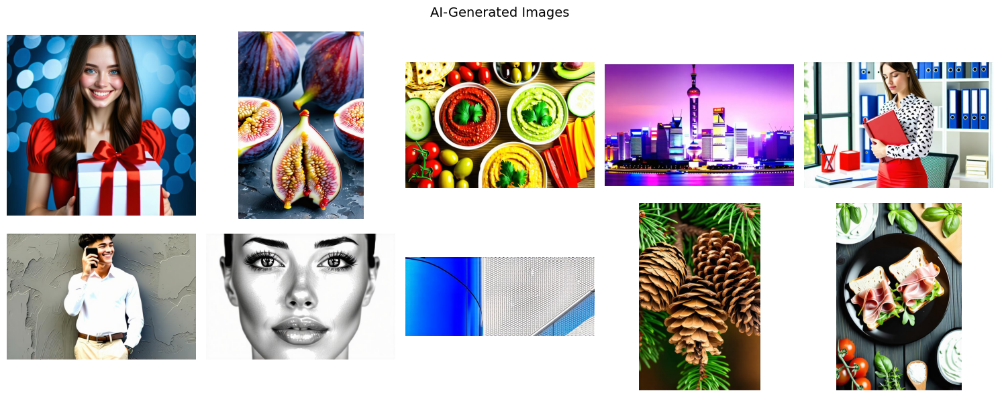

In [ ]:
# Show Random AI-generated images
show_class_images(comp_train_df, label=1, rows=2, cols=5, title="AI-Generated Images")

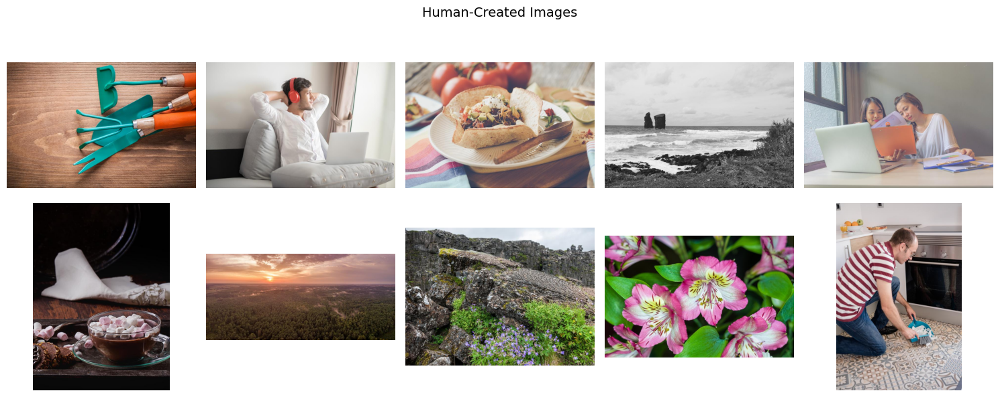

In [ ]:
# Show Random Human-created images
show_class_images(comp_train_df, label=0, rows=2, cols=5, title="Human-Created Images")

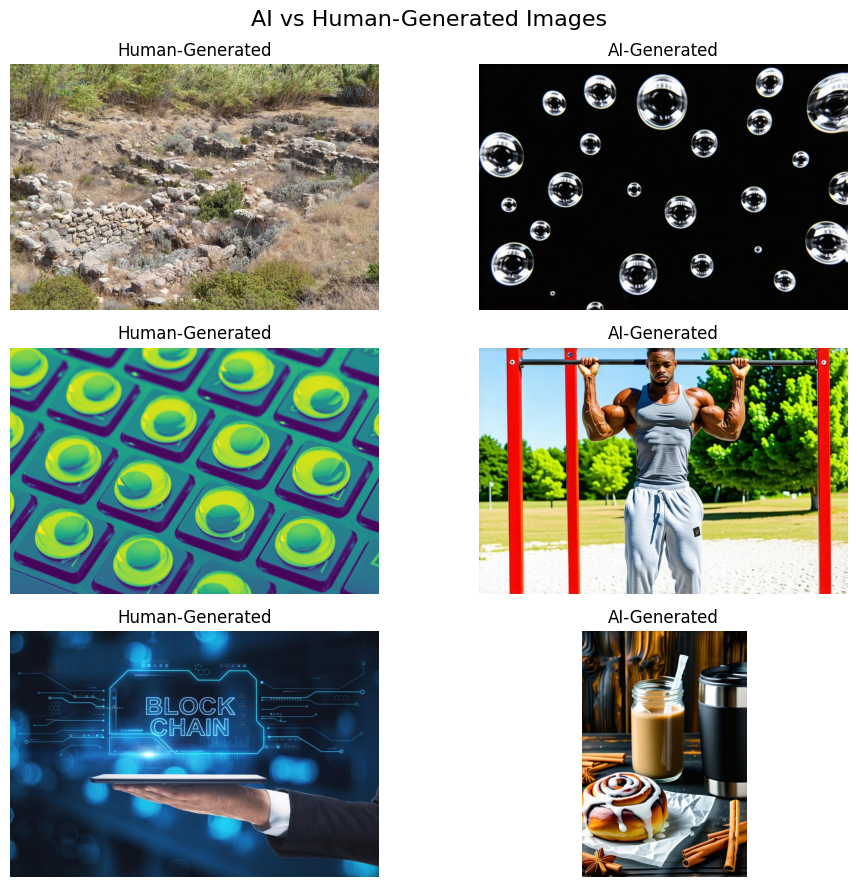

In [ ]:
compare_classes_images(comp_train_df, rows=3, title="AI vs Human-Generated Images")

### **Reading Test File**

In [ ]:
Comp_test_df = pd.read_csv(Dataset_Path + "test.csv")


Comp_test_df["file_path"] = Dataset_Path + Comp_test_df["id"]


Comp_test_df.head()

,id,file_path
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...


>**Check if test files exists**

In [ ]:
missing_files = Comp_test_df[~Comp_test_df["file_path"].apply(os.path.exists)]

print(f"Missing Test Images: {len(missing_files)}")

Missing Test Images: 0


> **Exploring Test Images**

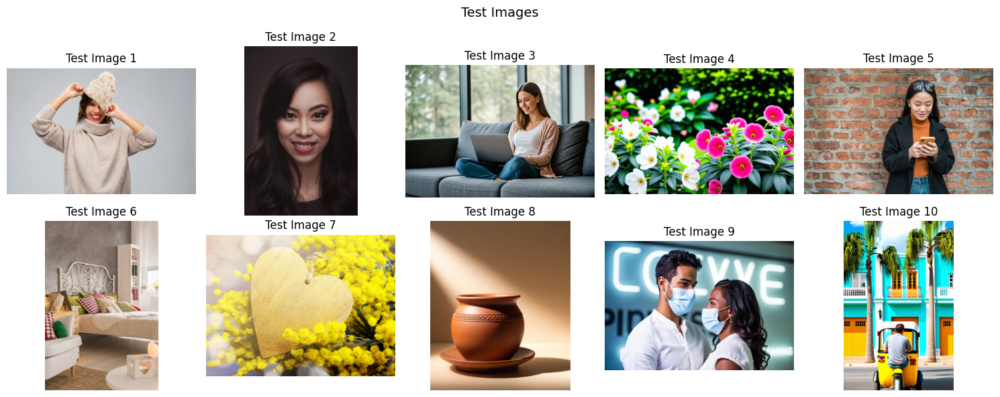

In [ ]:
show_test_images(Comp_test_df, rows=2, cols=5)

# **Splitting Test-Tain Sets**

In [ ]:
comp_train_df["label"] = comp_train_df["label"].map({0: "Human", 1: "AI"})
comp_train_df["label"]

,label
0,AI
1,Human
2,AI
3,Human
4,AI
...,...
79945,Human
79946,AI
79947,Human
79948,AI


In [ ]:
from sklearn.model_selection import GroupShuffleSplit

# Define the splitter
gss = GroupShuffleSplit(n_splits=1, test_size=0.10, random_state=0)

# Split the data into training and validation sets
train_idx, val_idx = next(gss.split(comp_train_df, groups=comp_train_df['group_id']))

# Create training and validation DataFrames
train_df = comp_train_df.iloc[train_idx].reset_index(drop=True)
val_df = comp_train_df.iloc[val_idx].reset_index(drop=True)

In [ ]:
# Testing with smaller train size

# comp_train_df_small = comp_train_df[comp_train_df['group_id'] <= 5000]
# comp_train_df_small

# from sklearn.model_selection import GroupShuffleSplit

# # Define the splitter
# gss = GroupShuffleSplit(n_splits=1, test_size=0.10, random_state=0)

# # Split the data into training and validation sets
# train_idx, val_idx = next(gss.split(comp_train_df_small, groups=comp_train_df_small['group_id']))

# # Create training and validation DataFrames
# train_df = comp_train_df.iloc[train_idx].reset_index(drop=True)
# val_df = comp_train_df.iloc[val_idx].reset_index(drop=True)

In [ ]:
# Check for overlapping group IDs
train_groups = set(train_df['group_id'])
val_groups = set(val_df['group_id'])
overlap = train_groups.intersection(val_groups)

print(f"Overlapping group IDs: {overlap}")

Overlapping group IDs: set()


In [ ]:
train_df

,file_name,label,group_id
0,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,1
1,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,1
2,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,2
3,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,2
4,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,3
...,...,...,...
71949,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,39973
71950,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,39974
71951,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,39974
71952,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,39975


In [ ]:
val_df

,file_name,label,group_id
0,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,7
1,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,7
2,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,19
3,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,19
4,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,23
...,...,...,...
7991,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,39949
7992,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,39955
7993,/kaggle/input/ai-vs-human-generated-dataset/tr...,Human,39955
7994,/kaggle/input/ai-vs-human-generated-dataset/tr...,AI,39972


# **Data Preprocessing**

### **Image Data Generatos**

In [ ]:
img_shape = 224

color_type = 3

batch_size = 64

In [ ]:
def Create_Splitted_Data(batch_size, train_data_path, train_df, test_df):

    train_preprocessor = ImageDataGenerator(
    )

    val_preprocessor = ImageDataGenerator(
    )


    train_generator = train_preprocessor.flow_from_dataframe(
        dataframe=train_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode='rgb',
        shuffle=True,
        batch_size=batch_size,
        seed=0
    )

    val_generator = val_preprocessor.flow_from_dataframe(
        dataframe=val_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

    return train_generator, val_generator

In [ ]:
train_data, val_data = Create_Splitted_Data(batch_size, Dataset_Path, train_df, val_df)

Found 71954 validated image filenames belonging to 2 classes.
Found 7996 validated image filenames belonging to 2 classes.


In [ ]:
print("Number of Train batches:", len(train_data))
print("Number of Val batches:", len(val_data))

Number of Train batches: 1125
Number of Val batches: 125


In [ ]:
Classes_Map = train_data.class_indices

Num_Classes = len(Classes_Map)

print("Number of Classes:", Num_Classes)
Classes_Map

Number of Classes: 2


{'Human': 0, 'AI': 1}

# **Data Augmentation**

### **Testing Augmentations**

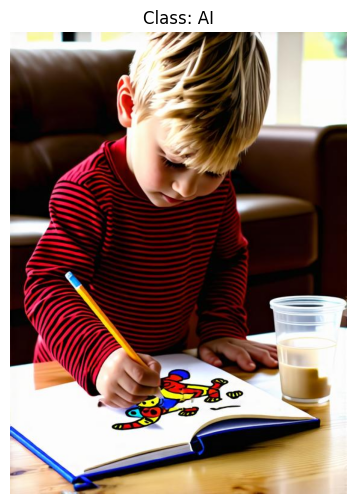

In [ ]:
def show_random_image_from_df(df, train_data_path):
    # Sample a random row from the DataFrame
    random_row = df.sample(1).iloc[0]
    file_name = random_row['file_name']
    label = random_row['label']

    # Construct the full file path
    image_path = os.path.join(train_data_path, file_name)

    # Read and display the image
    image = plt.imread(image_path)

    # Creating a dataset which contains just one image.
    test_augment_image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))

    plt.figure(figsize=(8, 6))
    plt.imshow(test_augment_image[0])
    plt.title(f"Class: {label}")
    plt.axis("off")
    plt.show()

    return test_augment_image

Train_Data_Path = Dataset_Path + "train_data/"
Test_Augment_Image = show_random_image_from_df(train_df, Train_Data_Path)

In [ ]:
def plot_augmented_imgdatagenerator_images(data_generator, Img_To_Aug, rows=3, cols=4):
    """
    Plots images generated by an object of the ImageDataGenerator class.
    """
    data_generator.fit(Img_To_Aug)
    image_iterator = data_generator.flow(Img_To_Aug)

    # Create a grid of subplots
    fig, axes = plt.subplots(rows, cols, figsize=(9, 8), subplot_kw={'xticks': [], 'yticks': []})

    # Loop over each axis in the grid
    for ax in axes.flat:
        # Get the next batch of augmented images
        batch = next(image_iterator)
        ax.imshow(batch[0].astype('uint8'))
        ax.axis('off')

    # Set the updated title and adjust the layout
    plt.suptitle("Augmented Images with ImageDataGenerators", fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
def plot_augmented_keraslayers_images(augmentation_pipeline, img, rows=3, cols=5):
    """
    Plot augmented versions of an input image using a Keras augmentation pipeline.
    """
    # Ensure the image has a batch dimension
    if img.ndim == 3:
        img = tf.expand_dims(img, axis=0)  # Shape becomes (1, H, W, C)

    total_images = rows * cols

    # Create a grid of subplots
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols * 3, rows * 3),
                             subplot_kw={'xticks': [], 'yticks': []})
    axes = axes.flatten()

    for i, ax in enumerate(axes):
        # Generate an augmented image
        aug_img = augmentation_pipeline(img, training=True)

        # Remove the batch dimension
        aug_img = tf.squeeze(aug_img, axis=0)

        # Display the image
        ax.imshow(aug_img.numpy().astype('uint8'))
        ax.axis('off')

    # Set the updated title
    plt.suptitle("Augmented Images with Keras Layers", fontsize=20, fontweight='bold')
    plt.tight_layout()
    plt.show()

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.2,0.8)),                                    # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.GaussianNoise(stddev=0.2),

  tf.keras.layers.RandomErasing(0.5),

], name = "augmentation_pipeline")

### **Applying Selected Augmentations**

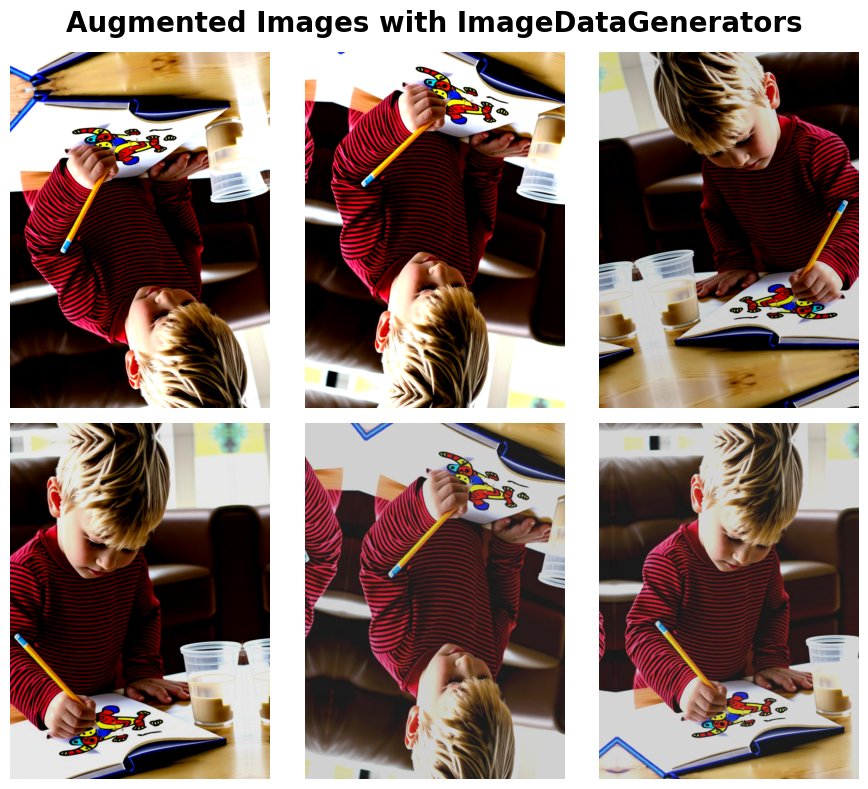

In [ ]:
train_preprocessor = ImageDataGenerator(
                                        zoom_range=(0.9, 1.1),
                                        rotation_range=15,
                                        width_shift_range=0.1,
                                        height_shift_range=0.1,
                                        horizontal_flip=True,
                                        vertical_flip=True,
                                        shear_range=0.1,
                                        brightness_range=[0.8, 1.2],
                                        channel_shift_range=50,
                                        fill_mode='reflect',
                                        )

plot_augmented_imgdatagenerator_images(train_preprocessor, Test_Augment_Image, 2, 3)

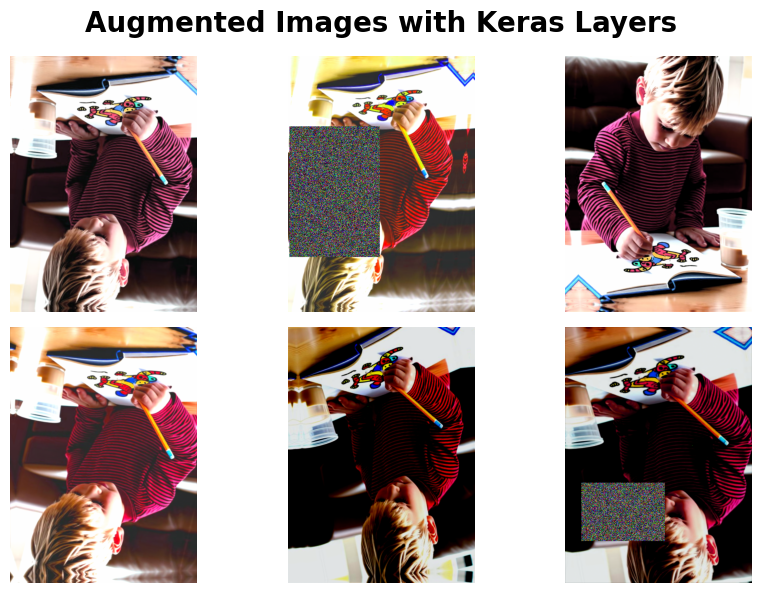

In [ ]:
plot_augmented_keraslayers_images(augmentation_pipeline, Test_Augment_Image, 2, 3)

### **Creating Augmented Data**

In [ ]:
def Create_Aug_Datagens(batch_size, train_data_path, train_df, val_df):

    train_preprocessor = ImageDataGenerator(
        zoom_range=(0.9, 1.1),
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        brightness_range=[0.8, 1.2],
        channel_shift_range=0.2,
        fill_mode='reflect',
    )

    train_generator = train_preprocessor.flow_from_dataframe(
        dataframe=train_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape, img_shape),
        color_mode='rgb',
        shuffle=True,
        batch_size=batch_size,
        seed=0
    )


    val_generator = train_preprocessor.flow_from_dataframe(
        dataframe=val_df,
        directory=train_data_path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

    return train_generator, val_generator

In [ ]:
train_AugData, tta_val_data = Create_Aug_Datagens(batch_size, Dataset_Path, train_df, val_df)

Found 71954 validated image filenames belonging to 2 classes.
Found 7996 validated image filenames belonging to 2 classes.


# **EfficientNetV2S Pre-Trained Model**

### **Fine-Tuning Pre-Trained Model**

In [ ]:
from keras.applications.efficientnet_v2 import EfficientNetV2S

EfficientNetv2s = EfficientNetV2S(input_shape=(img_shape, img_shape, color_type),
              include_top= False,
              weights='imagenet',
              )

# EfficientNetV2S.summary()

82420632/82420632 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
NoModelLayers = len(EfficientNetv2s.layers)

print("Number of EfficientNetV2S Model Layers: ", NoModelLayers)

Number of EfficientNetV2S Model Layers:  513


### **Model Architecture**

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.2,0.8)),                                    # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.GaussianNoise(stddev=0.2),

  tf.keras.layers.RandomErasing(0.5),

], name = "augmentation_pipeline")

In [ ]:
def Create_EfficientNetV2S_Model(input_shape=(img_shape, img_shape, color_type)):

    inputs = Input(shape=input_shape)

    # Apply augmentation
    x = augmentation_pipeline(inputs)

    efficientnet_base = EfficientNetV2S(include_top=False, weights="imagenet", input_shape=(img_shape, img_shape, color_type))

    # Freezing Specific Percentage of Network Layers
    Freezing_Percentage = 0.50

    efficientnet_base.trainable = True

    for layer in efficientnet_base.layers[:-int(NoModelLayers * Freezing_Percentage)]:
        layer.trainable = False


    # Pass through the efficientnet base model.
    x = efficientnet_base(x)

    # Optionally add a BatchNormalization layer.
    x = BatchNormalization()(x)

    x = SpatialDropout2D(rate=0.25)(x)  # Drops entire feature maps

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    x = Dense(256, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.4)(x)

    x = Dense(256, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.5)(x)

    # Final classifier for binary classification.
    outputs = Dense(1, activation="sigmoid", kernel_initializer="GlorotUniform")(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
EfficientNetV2S_Model = Create_EfficientNetV2S_Model()

optimizer = tf.keras.optimizers.AdamW(0.0001)

EfficientNetV2S_Model.compile(optimizer= optimizer , loss=custom_fairness_loss(alpha=1.0, beta = 0.5, label_smoothing=0.2), metrics=['accuracy'])

EfficientNetV2S_Model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ augmentation_pipeline           │ (None, 224, 224, 3)    │             0 │
│ (Sequential)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-s (Functional)   │ (None, 7, 7, 1280)     │    20,331,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 7, 7, 1280)     │         5,120 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ spatial_dropout2d               │ (None, 7, 7, 1280)     │             0 │
│ (SpatialDropout2D)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_dropout                │ (None, 256)            │             0 │
│ (GaussianDropout)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 256)            │        65,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ gaussian_dropout_1              │ (None, 256)            │             0 │
│ (GaussianDropout)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,732,513 (79.09 MB)

 Trainable params: 16,085,241 (61.36 MB)

 Non-trainable params: 4,647,272 (17.73 MB)

In [ ]:
# plot_model(EfficientNetV2S_Model,"EfficientNetV2S_Model.png", show_shapes=True, show_layer_names=True)

### **Specifying Callbacks**

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_loss', patience = 2,
                               restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = ReduceLROnPlateau( monitor = "val_loss",
                                 patience = 1,
                                 verbose = 1,
                                 min_lr=0.00005,
                                 factor = 0.5,
                                 min_delta = 0.0001)

callbacks = [Early_Stopping, Reducing_LR]

### **Fitting EfficientNetV2S Model**

In [ ]:
EfficientNetV2S_history = EfficientNetV2S_Model.fit(train_data,
                                            validation_data = val_data, epochs=5,
                                            batch_size=batch_size,
                                            callbacks = callbacks)

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1422s 1s/step - accuracy: 0.7638 - loss: 51.4159 - val_accuracy: 0.9616 - val_loss: 7.2336 - learning_rate: 1.0000e-04
Epoch 2/5
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1049s 913ms/step - accuracy: 0.9321 - loss: 4.6230 - val_accuracy: 0.9720 - val_loss: 1.1705 - learning_rate: 1.0000e-04
Epoch 3/5
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1002s 891ms/step - accuracy: 0.9611 - loss: 0.8649 - val_accuracy: 0.9669 - val_loss: 0.4392 - learning_rate: 1.0000e-04
Epoch 4/5
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1018s 905ms/step - accuracy: 0.9701 - loss: 0.4290 - val_accuracy: 0.9821 - val_loss: 0.3995 - learning_rate: 1.0000e-04
Epoch 5/5
1125/1125 ━━━━━━━━━━━━━━━━━━━━ 1018s 905ms/step - accuracy: 0.9755 - loss: 0.4133 - val_accuracy: 0.9822 - val_loss: 0.3940 - learning_rate: 1.0000e-04
Restoring model weights from the end of the best epoch: 5.


In [ ]:
EfficientNetV2S_Scores = EfficientNetV2S_Model.evaluate(val_data)

print("    Val Loss: {:.5f}".format(EfficientNetV2S_Scores[0]))
print("Val Accuracy: {:.2f}%".format(EfficientNetV2S_Scores[1] * 100))

125/125 ━━━━━━━━━━━━━━━━━━━━ 64s 509ms/step - accuracy: 0.9822 - loss: 0.3941
    Val Loss: 0.39403
Val Accuracy: 98.22%


### **Evaluating Model**

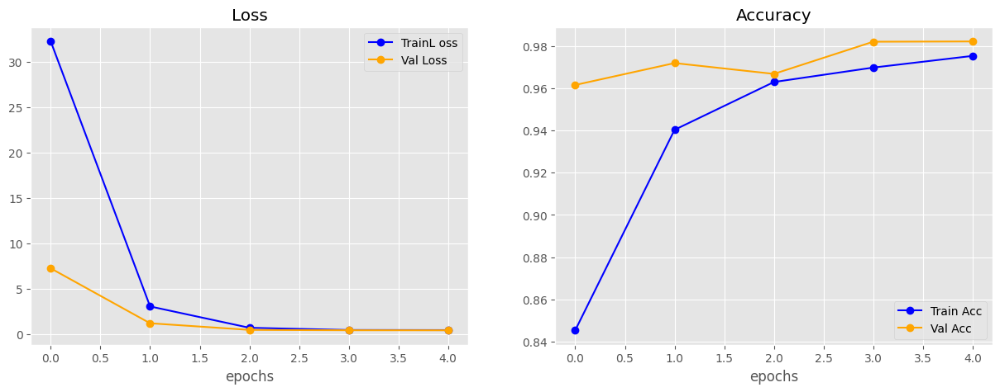

In [ ]:
plot_history_curves(EfficientNetV2S_history)

In [ ]:
EfficientNetV2S_Val_Predictions_Probs = EfficientNetV2S_Model.predict(val_data)

decisionThreshold = 0.5

EfficientNetV2S_Val_Predictions = [1 if pred > decisionThreshold else 0 for pred in EfficientNetV2S_Val_Predictions_Probs]

EfficientNetV2S_Val_Predictions[:5]

125/125 ━━━━━━━━━━━━━━━━━━━━ 81s 592ms/step


[1, 0, 1, 0, 1]

[Metrics Summary]
Accuracy = 98.22% | Balanced Accuracy = 98.22% | Precision = 98.23% | Recall = 98.22% | F1-Score = 98.22% | F-Beta Score = 98.22% | AUC Score = 99.80% | Average Precision = 99.77%


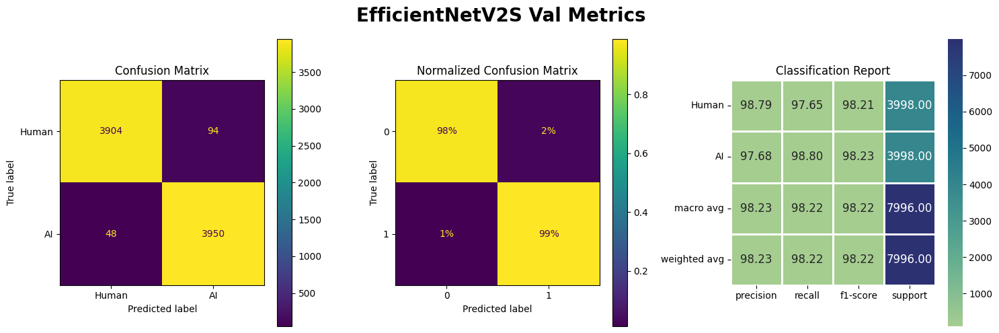


 EfficientNetV2S Val Classification Report: 
               precision    recall  f1-score   support

       Human       0.99      0.98      0.98      3998
          AI       0.98      0.99      0.98      3998

    accuracy                           0.98      7996
   macro avg       0.98      0.98      0.98      7996
weighted avg       0.98      0.98      0.98      7996



In [ ]:
make_classification_plots(val_data.labels, EfficientNetV2S_Val_Predictions_Probs, decisionThreshold, "EfficientNetV2S Val")

[Positive Class Metrics Summary]
Precision = 97.68% | Recall = 98.80% | F1-Score = 98.23% | F-Beta Score = 98.57% | AUC Micro Score = 99.80%


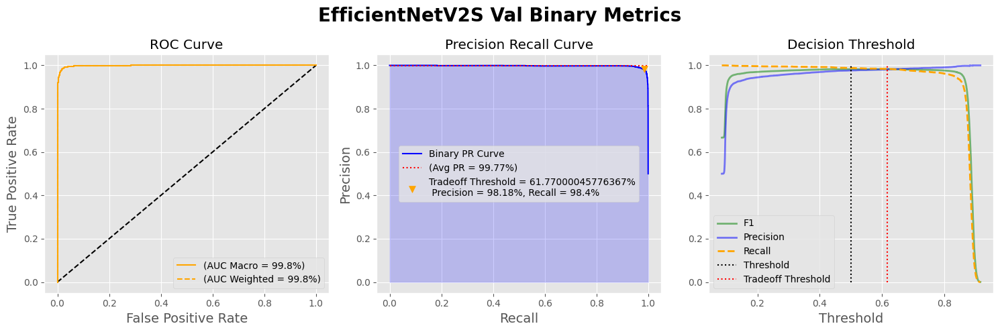

In [ ]:
EfficientNetV2S_Val_Best_Threshold = make_binary_classification_plots(
    val_data.labels, EfficientNetV2S_Val_Predictions_Probs, decisionThreshold, "EfficientNetV2S Val")

,samples,micro,macro,weighted
AUC,99.800000,99.800000,99.800000,99.800000
mAP,99.770000,99.770000,99.770000,99.770000


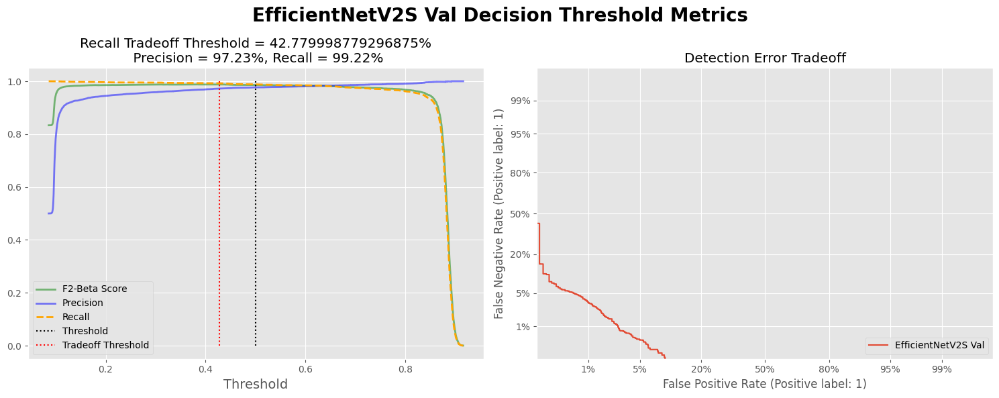

In [ ]:
EfficientNetV2S_Val_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, EfficientNetV2S_Val_Predictions_Probs, decisionThreshold, "EfficientNetV2S Val")

### **Test-Time Augmentation**

In [ ]:
EfficientNetV2S_Val_TTA_Predictions_Probs = apply_tta(EfficientNetV2S_Model, val_data, tta_val_data, num_augmentations=5)

In [ ]:
decisionThreshold = 0.5

EfficientNetV2S_Val_TTA_Predictions = [1 if pred > decisionThreshold else 0 for pred in EfficientNetV2S_Val_TTA_Predictions_Probs]

EfficientNetV2S_Val_TTA_Predictions[:5]

In [ ]:
make_classification_plots(val_data.labels, EfficientNetV2S_Val_TTA_Predictions_Probs, decisionThreshold, "EfficientNetV2S TTA Val")

In [ ]:
EfficientNetV2S_Val_TTA_Best_Threshold = make_binary_classification_plots(
    val_data.labels, EfficientNetV2S_Val_TTA_Predictions_Probs, decisionThreshold, "EfficientNetV2S TTA Val")

In [ ]:
EfficientNetV2S_Val_TTA_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, EfficientNetV2S_Val_TTA_Predictions_Probs, decisionThreshold, "EfficientNetV2S TTA Val")

# **ConvNeXt Pre-Trained Model**

### **Fine-Tuning Pre-Trained Model**

In [ ]:
from keras.applications.convnext import ConvNeXtBase

ConvNeXt = ConvNeXtBase(input_shape=(img_shape, img_shape, color_type),
              include_top= False,
              weights='imagenet',
              )

# ConvNeXt.summary()

In [ ]:
NoModelLayers = len(ConvNeXt.layers)

print("Number of ConvNeXt Model Layers: ", NoModelLayers)

Number of ConvNeXt Model Layers:  259


### **Model Architecture**

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.2,0.8)),                                    # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.GaussianNoise(stddev=0.2),

  tf.keras.layers.RandomErasing(0.5),

], name = "augmentation_pipeline")

In [ ]:
def Create_ConvNeXt_Model(input_shape=(img_shape, img_shape, color_type)):

    inputs = Input(shape=input_shape)

    # Apply augmentation
    x = augmentation_pipeline(inputs)

    convnext_base = ConvNeXtBase(include_top=False, weights="imagenet", input_shape=(img_shape, img_shape, color_type))

    # Freezing Specific Percentage of Network Layers
    Freezing_Percentage = 0.5

    convnext_base.trainable = True

    for layer in convnext_base.layers[:-int(NoModelLayers * Freezing_Percentage)]:
        layer.trainable = False

    # Pass through the convnext base model.
    x = convnext_base(x)

    #  BatchNormalization layer.
    x = BatchNormalization()(x)

    x = SpatialDropout2D(rate=0.25)(x)  # Drops entire feature maps

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Dense head
    x = Dense(512, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.4)(x)

    x = Dense(512, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.5)(x)

    # Final classifier for binary classification.
    outputs = Dense(1, activation="sigmoid", kernel_initializer="GlorotUniform")(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
ConvNeXt_Model = Create_ConvNeXt_Model()

optimizer = tf.keras.optimizers.AdamW(0.0001)

ConvNeXt_Model.compile(optimizer= optimizer , loss=custom_fairness_loss(alpha, beta, label_smoothing=0.2), metrics=['accuracy'])

ConvNeXt_Model.summary()

Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_30 (InputLayer)          │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_pipeline (Sequential)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ convnext_base (Functional)           │ (None, 7, 7, 1024)          │      87,566,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 7, 7, 1024)          │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ spatial_dropout2d_2                  │ (None, 7, 7, 1024)          │               0 │
│ (SpatialDropout2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_2           │ (None, 1024)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 512)                 │         524,800 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gaussian_dropout_2 (GaussianDropout) │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_8                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gaussian_dropout_3 (GaussianDropout) │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1)                   │             513 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 88,362,625 (337.08 MB)

 Trainable params: 60,140,033 (229.42 MB)

 Non-trainable params: 28,222,592 (107.66 MB)

In [ ]:
# plot_model(ConvNeXt_Model,"ConvNeXt_Model.png", show_shapes=True, show_layer_names=True)

### **Specifying Callbacks**

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_loss', patience = 2,
                               restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = ReduceLROnPlateau( monitor = "val_loss",
                                 patience = 1,
                                 verbose = 1,
                                 min_lr=0.00005,
                                 factor = 0.5,
                                 min_delta = 0.0001)

callbacks = [Early_Stopping, Reducing_LR]

### **Fitting ConvNeXt Model**

In [ ]:
ConvNeXt_history = ConvNeXt_Model.fit(train_data,
                                    validation_data = val_data, epochs=5,
                                    batch_size=batch_size,
                                    callbacks = callbacks)

Epoch 1/5
2249/2249 ━━━━━━━━━━━━━━━━━━━━ 3249s 1s/step - accuracy: 0.8496 - loss: 77.8642 - val_accuracy: 0.9826 - val_loss: 0.9944 - learning_rate: 1.0000e-04
Epoch 2/5
2249/2249 ━━━━━━━━━━━━━━━━━━━━ 3211s 1s/step - accuracy: 0.9822 - loss: 0.5739 - val_accuracy: 0.9885 - val_loss: 0.4265 - learning_rate: 1.0000e-04
Epoch 3/5
2249/2249 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9869 - loss: 0.4438
Epoch 3: ReduceLROnPlateau reducing learning rate to 5e-05.
2249/2249 ━━━━━━━━━━━━━━━━━━━━ 3205s 1s/step - accuracy: 0.9869 - loss: 0.4438 - val_accuracy: 0.9902 - val_loss: 0.4268 - learning_rate: 1.0000e-04
Epoch 4/5
2249/2249 ━━━━━━━━━━━━━━━━━━━━ 3205s 1s/step - accuracy: 0.9921 - loss: 0.3949 - val_accuracy: 0.9866 - val_loss: 0.3932 - learning_rate: 5.0000e-05
Epoch 5/5
2249/2249 ━━━━━━━━━━━━━━━━━━━━ 3216s 1s/step - accuracy: 0.9941 - loss: 0.3892 - val_accuracy: 0.9870 - val_loss: 0.3925 - learning_rate: 5.0000e-05
Restoring model weights from the end of the best epoch: 5.


In [ ]:
ConvNeXt_Scores = ConvNeXt_Model.evaluate(val_data)

print("    Val Loss: {:.5f}".format(ConvNeXt_Scores[0]))
print("Val Accuracy: {:.2f}%".format(ConvNeXt_Scores[1] * 100))

250/250 ━━━━━━━━━━━━━━━━━━━━ 139s 554ms/step - accuracy: 0.9869 - loss: 0.3924
    Val Loss: 0.39247
Val Accuracy: 98.70%


### **Evaluating Model**

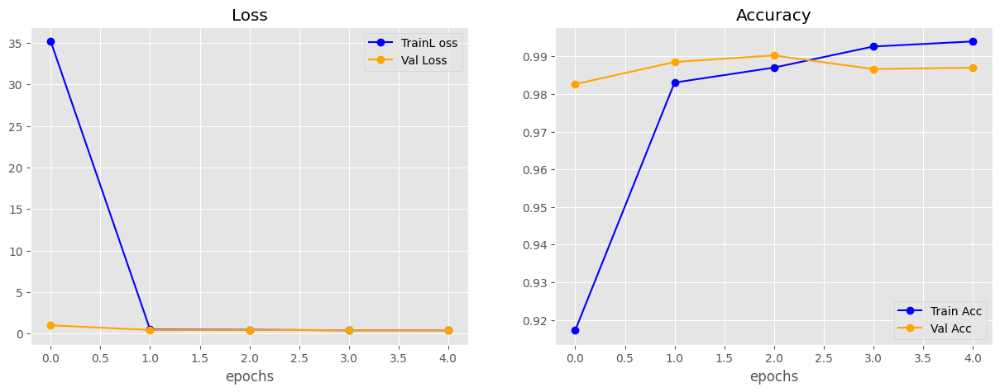

In [ ]:
plot_history_curves(ConvNeXt_history)

In [ ]:
ConvNeXt_Val_Predictions_Probs = ConvNeXt_Model.predict(val_data)

decisionThreshold = 0.5

ConvNeXt_Val_Predictions = [1 if pred > decisionThreshold else 0 for pred in ConvNeXt_Val_Predictions_Probs]

ConvNeXt_Val_Predictions[:5]

250/250 ━━━━━━━━━━━━━━━━━━━━ 145s 567ms/step


[1, 0, 1, 0, 1]

[Metrics Summary]
Accuracy = 98.70% | Balanced Accuracy = 98.70% | Precision = 98.72% | Recall = 98.70% | F1-Score = 98.70% | F-Beta Score = 98.70% | AUC Score = 99.96% | Average Precision = 99.96%


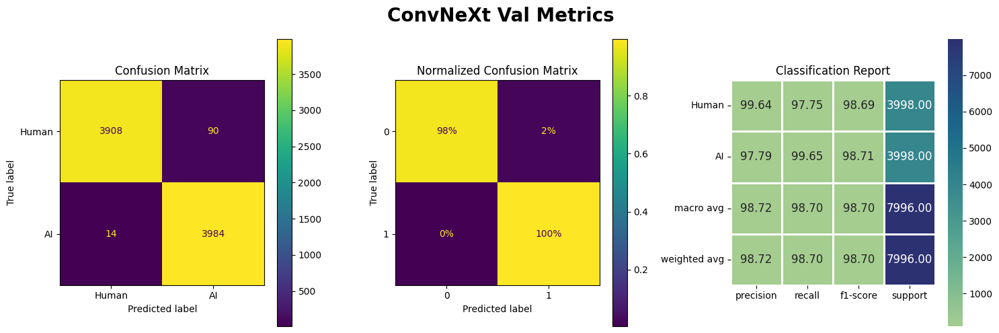


 ConvNeXt Val Classification Report: 
               precision    recall  f1-score   support

       Human       1.00      0.98      0.99      3998
          AI       0.98      1.00      0.99      3998

    accuracy                           0.99      7996
   macro avg       0.99      0.99      0.99      7996
weighted avg       0.99      0.99      0.99      7996



In [ ]:
make_classification_plots(val_data.labels, ConvNeXt_Val_Predictions_Probs, decisionThreshold, "ConvNeXt Val")

[Positive Class Metrics Summary]
Precision = 97.79% | Recall = 99.65% | F1-Score = 98.71% | F-Beta Score = 99.27% | AUC Micro Score = 99.96%


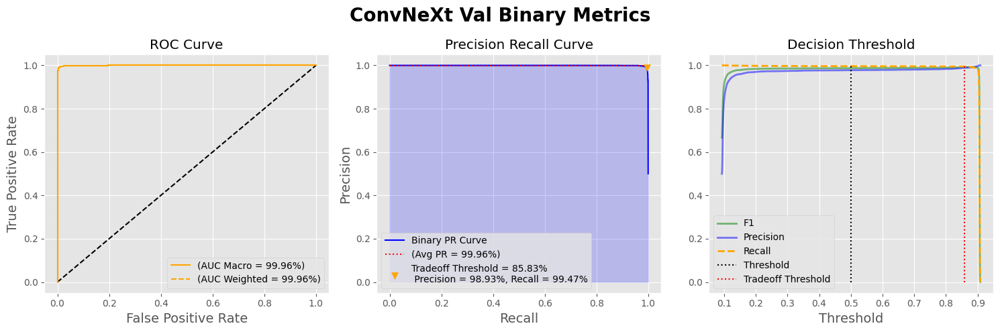

In [ ]:
ConvNeXt_Val_Best_Threshold = make_binary_classification_plots(
    val_data.labels, ConvNeXt_Val_Predictions_Probs, decisionThreshold, "ConvNeXt Val")

,samples,micro,macro,weighted
AUC,99.960000,99.960000,99.960000,99.960000
mAP,99.960000,99.960000,99.960000,99.960000


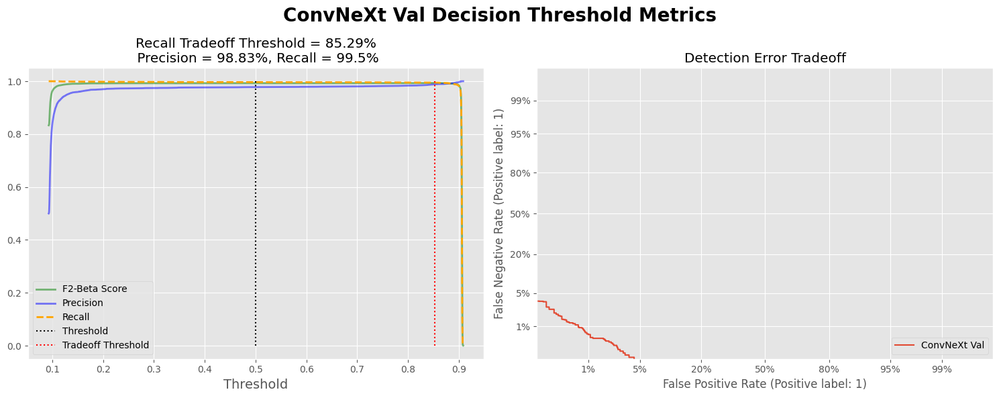

In [ ]:
ConvNeXt_Val_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, ConvNeXt_Val_Predictions_Probs, decisionThreshold, "ConvNeXt Val")

### **Test-Time Augmentation**

In [ ]:
ConvNeXt_Val_TTA_Predictions_Probs = apply_tta(ConvNeXt_Model, val_data, tta_val_data, num_augmentations=5)

250/250 ━━━━━━━━━━━━━━━━━━━━ 142s 569ms/step


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


250/250 ━━━━━━━━━━━━━━━━━━━━ 228s 912ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 226s 903ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 226s 905ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 226s 905ms/step


In [ ]:
decisionThreshold = 0.5

ConvNeXt_Val_TTA_Predictions = [1 if pred > decisionThreshold else 0 for pred in ConvNeXt_Val_TTA_Predictions_Probs]

ConvNeXt_Val_TTA_Predictions[:5]

[1, 0, 1, 0, 1]

[Metrics Summary]
Accuracy = 99.51% | Balanced Accuracy = 99.51% | Precision = 99.51% | Recall = 99.51% | F1-Score = 99.51% | F-Beta Score = 99.51% | AUC Score = 99.99% | Average Precision = 99.99%


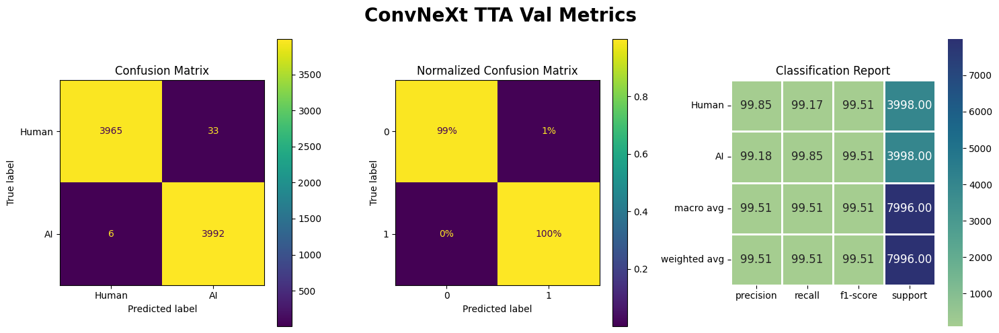


 ConvNeXt TTA Val Classification Report: 
               precision    recall  f1-score   support

       Human       1.00      0.99      1.00      3998
          AI       0.99      1.00      1.00      3998

    accuracy                           1.00      7996
   macro avg       1.00      1.00      1.00      7996
weighted avg       1.00      1.00      1.00      7996



In [ ]:
make_classification_plots(val_data.labels, ConvNeXt_Val_TTA_Predictions_Probs, decisionThreshold, "ConvNeXt TTA Val")

[Positive Class Metrics Summary]
Precision = 99.18% | Recall = 99.85% | F1-Score = 99.51% | F-Beta Score = 99.72% | AUC Micro Score = 99.99%


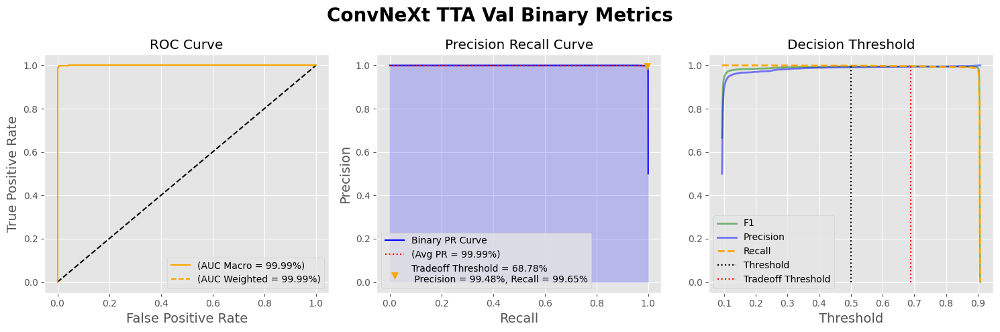

In [ ]:
ConvNeXt_Val_TTA_Best_Threshold = make_binary_classification_plots(
    val_data.labels, ConvNeXt_Val_TTA_Predictions_Probs, decisionThreshold, "ConvNeXt TTA Val")

,samples,micro,macro,weighted
AUC,99.990000,99.990000,99.990000,99.990000
mAP,99.990000,99.990000,99.990000,99.990000


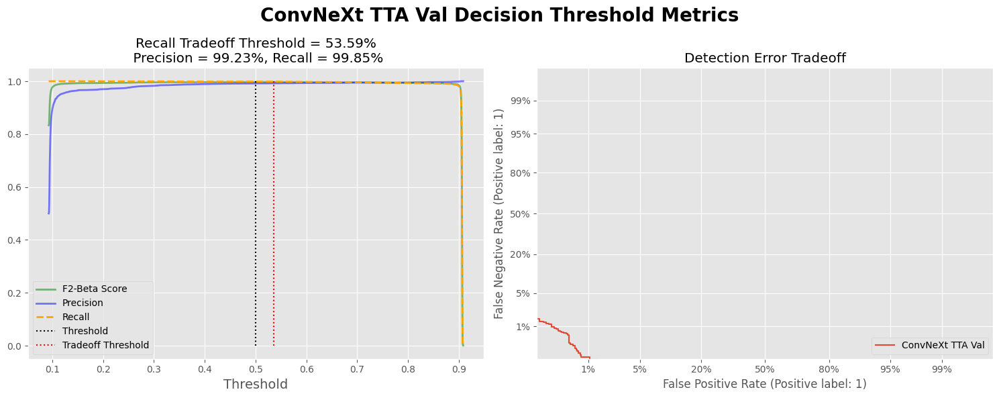

In [ ]:
ConvNeXt_Val_TTA_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, ConvNeXt_Val_TTA_Predictions_Probs, decisionThreshold, "ConvNeXt TTA Val")

# **EfficientNetB5SW Pre-Trained Model**

### **Fine-Tuning Pre-Trained Model**

In [ ]:
import keras_hub

classifier = keras_hub.models.ImageClassifier.from_preset("efficientnet_b5_sw_ft_imagenet")

classifier

<EfficientNetImageClassifier name=efficient_net_image_classifier, built=True>

In [ ]:
classifier_preprocessor = keras_hub.models.ImageClassifierPreprocessor.from_preset("efficientnet_b5_sw_ft_imagenet")

classifier_preprocessor

<EfficientNetImageClassifierPreprocessor name=efficient_net_image_classifier_preprocessor, built=False>

In [ ]:
EfficientNetB5SW = classifier.backbone
EfficientNetB5SW.summary()

In [ ]:
NoModelLayers = len(EfficientNetB5SW.layers)

print("Number of EfficientNetB5SW Model Layers: ", NoModelLayers)

Number of EfficientNetB5SW Model Layers:  577


### **Model Architecture**

In [ ]:
augmentation_pipeline = tf.keras.Sequential([

  tf.keras.layers.Input(shape=(img_shape,img_shape,color_type)),

  # Data augmentation techniques
  tf.keras.layers.RandomFlip("horizontal_and_vertical"),                         # Orientation invariance
  tf.keras.layers.RandomRotation(0.05),                                          # Small tilts
  tf.keras.layers.RandomZoom(0.1, 0.1),                                          # Scale robustness
  tf.keras.layers.RandomShear(0.1, 0.1),                                         # Slight tilt

  tf.keras.layers.RandomSharpness((0.2,0.8)),                                    # Noise & Sharpness for structural focus

  tf.keras.layers.RandomColorJitter(
      brightness_factor=0.2,                                                     # Subtle lighting changes
      contrast_factor=0.2,                                                       # Subtle contrast changes
      saturation_factor=(0.4,0.6),                                               # Subtle saturation changes
      hue_factor=0.1),                                                           # Subtle hue changes

  tf.keras.layers.GaussianNoise(stddev=0.2),

  tf.keras.layers.RandomErasing(0.5),

], name = "augmentation_pipeline")

In [ ]:
# Create a modified preprocessor that resizes to 224x224

modified_preprocessor = Sequential([
    classifier_preprocessor,  # Original preprocessing (resizes to 448x448 + normalization)
    tf.keras.layers.Resizing(height=img_shape, width=img_shape, name="resize_to_224")  # Resize to 224x224

], name="modified_preprocessor")

In [ ]:
def Create_EfficientNetB5SW_Model(input_shape=(img_shape, img_shape, color_type)):

    inputs = Input(shape=input_shape)

    # Apply augmentation
    x = augmentation_pipeline(inputs)

    efficientnet_base = EfficientNetB5SW

    # Apply EfficientNetB5 Prprocessing
    x = modified_preprocessor(x)

    # Freezing Specific Percentage of Network Layers
    Freezing_Percentage = 0.5

    efficientnet_base.trainable = True

    for layer in efficientnet_base.layers[:-int(NoModelLayers * Freezing_Percentage)]:
        layer.trainable = False


    # Pass through the efficientnet base model.
    x = efficientnet_base(x)

    # Optionally add a BatchNormalization layer.
    x = BatchNormalization()(x)

    x = SpatialDropout2D(rate=0.25)(x)  # Drops entire feature maps

    # Global Average Pooling
    x = GlobalAveragePooling2D()(x)

    # Dense head
    x = Dense(512, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.4)(x)

    x = Dense(512, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.4)(x)

    x = Dense(256, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.4)(x)

    x = Dense(256, kernel_initializer="he_normal", activation='relu', kernel_regularizer=regularizers.L1L2(0.005))(x)
    x = BatchNormalization()(x)
    x = GaussianDropout(0.5)(x)

    # Final classifier for binary classification.
    outputs = Dense(1, activation="sigmoid", kernel_initializer="GlorotUniform")(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

In [ ]:
EfficientNetB5SW_Model = Create_EfficientNetB5SW_Model()

optimizer = tf.keras.optimizers.AdamW(0.0001)

EfficientNetB5SW_Model.compile(optimizer= optimizer , loss=custom_fairness_loss(alpha, beta, label_smoothing=0.2), metrics=['accuracy'])

EfficientNetB5SW_Model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ augmentation_pipeline (Sequential)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ modified_preprocessor (Sequential)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficient_net_backbone               │ (None, 7, 7, 2048)          │      28,513,520 │
│ (EfficientNetBackbone)               │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 7, 7, 2048)          │           8,192 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ spatial_dropout2d (SpatialDropout2D) │ (None, 7, 7, 2048)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gaussian_dropout (GaussianDropout)   │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gaussian_dropout_1 (GaussianDropout) │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ gaussian_dropout_2 (GaussianDropout) │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │              

 Total params: 30,036,977 (114.58 MB)

 Trainable params: 27,864,065 (106.29 MB)

 Non-trainable params: 2,172,912 (8.29 MB)

In [ ]:
plot_model(EfficientNetB5SW_Model,"EfficientNetB5SW.png", show_shapes=True, show_layer_names=True)

### **Specifying Callbacks**

In [ ]:
# Create Early Stopping Callback to monitor the accuracy
Early_Stopping = EarlyStopping(monitor = 'val_loss', patience = 2,
                               restore_best_weights = True, verbose=1)

# Create ReduceLROnPlateau Callback to reduce overfitting by decreasing learning rate
Reducing_LR = ReduceLROnPlateau( monitor = "val_loss",
                                 patience = 1,
                                 verbose = 1,
                                 min_lr=0.00005,
                                 factor = 0.5,
                                 min_delta = 0.0001)

callbacks = [Early_Stopping, Reducing_LR]

### **Fitting EfficientNetB5SW Model**

In [ ]:
EfficientNetB5SW_history = EfficientNetB5SW_Model.fit(train_data,
                                            validation_data = val_data, epochs=5,
                                            batch_size=batch_size,
                                            callbacks = callbacks)

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/5
1187/1187 ━━━━━━━━━━━━━━━━━━━━ 1822s 1s/step - accuracy: 0.7746 - loss: 164.5828 - val_accuracy: 0.9300 - val_loss: 16.4333 - learning_rate: 1.0000e-04
Epoch 2/5
1187/1187 ━━━━━━━━━━━━━━━━━━━━ 1742s 1s/step - accuracy: 0.9582 - loss: 9.1547 - val_accuracy: 0.9890 - val_loss: 0.9240 - learning_rate: 1.0000e-04
Epoch 3/5
1187/1187 ━━━━━━━━━━━━━━━━━━━━ 1751s 1s/step - accuracy: 0.9824 - loss: 0.6308 - val_accuracy: 0.9920 - val_loss: 0.4317 - learning_rate: 1.0000e-04
Epoch 4/5
1187/1187 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.9870 - loss: 0.4508
Epoch 4: ReduceLROnPlateau reducing learning rate to 5e-05.
1187/1187 ━━━━━━━━━━━━━━━━━━━━ 1747s 1s/step - accuracy: 0.9870 - loss: 0.4508 - val_accuracy: 0.9827 - val_loss: 0.4480 - learning_rate: 1.0000e-04
Epoch 5/5
1187/1187 ━━━━━━━━━━━━━━━━━━━━ 1756s 1s/step - accuracy: 0.9913 - loss: 0.4146 - val_accuracy: 0.9902 - val_loss: 0.4046 - learning_rate: 5.0000e-05
Restoring model weights from the end of the best epoch: 5.


In [ ]:
EfficientNetB5SW_Scores = EfficientNetB5SW_Model.evaluate(val_data)

print("    Val Loss: {:.5f}".format(EfficientNetB5SW_Scores[0]))
print("Val Accuracy: {:.2f}%".format(EfficientNetB5SW_Scores[1] * 100))

63/63 ━━━━━━━━━━━━━━━━━━━━ 70s 1s/step - accuracy: 0.9899 - loss: 0.4045
    Val Loss: 0.40456
Val Accuracy: 99.02%


### **Evaluating Model**

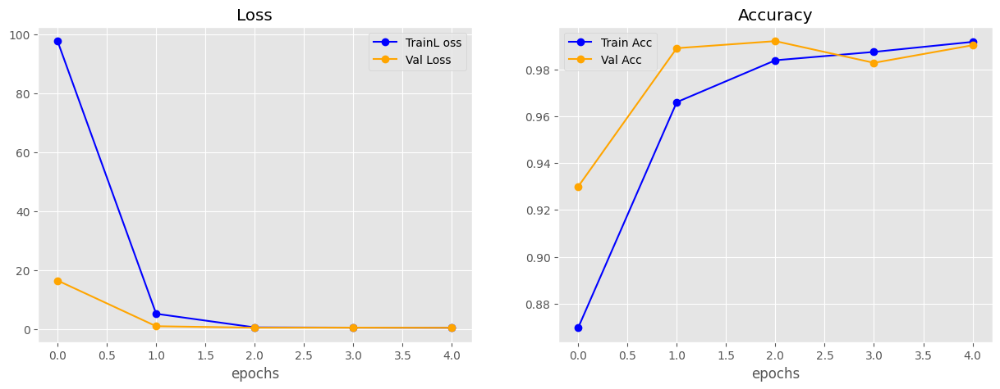

In [ ]:
plot_history_curves(EfficientNetB5SW_history)

In [ ]:
EfficientNetB5SW_Val_Predictions_Probs = EfficientNetB5SW_Model.predict(val_data)

decisionThreshold = 0.5

EfficientNetB5SW_Val_Predictions = [1 if pred > decisionThreshold else 0 for pred in EfficientNetB5SW_Val_Predictions_Probs]

EfficientNetB5SW_Val_Predictions[:5]

63/63 ━━━━━━━━━━━━━━━━━━━━ 77s 1s/step


[1, 0, 1, 0, 1]

[Metrics Summary]
Accuracy = 99.02% | Balanced Accuracy = 99.02% | Precision = 99.03% | Recall = 99.02% | F1-Score = 99.02% | F-Beta Score = 99.02% | AUC Score = 99.93% | Average Precision = 99.92%


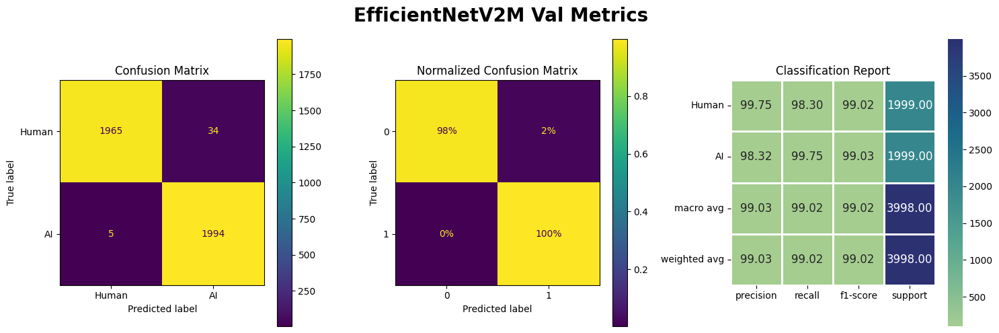


 EfficientNetV2M Val Classification Report: 
               precision    recall  f1-score   support

       Human       1.00      0.98      0.99      1999
          AI       0.98      1.00      0.99      1999

    accuracy                           0.99      3998
   macro avg       0.99      0.99      0.99      3998
weighted avg       0.99      0.99      0.99      3998



In [ ]:
make_classification_plots(val_data.labels, EfficientNetB5SW_Val_Predictions_Probs, decisionThreshold, "EfficientNetB5SW Val")

[Positive Class Metrics Summary]
Precision = 98.32% | Recall = 99.75% | F1-Score = 99.03% | F-Beta Score = 99.46% | AUC Micro Score = 99.93%


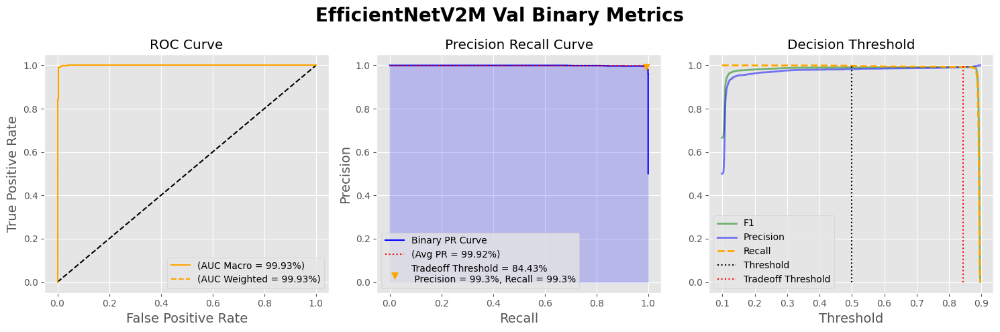

In [ ]:
EfficientNetB5SW_Val_Best_Threshold = make_binary_classification_plots(
    val_data.labels, EfficientNetB5SW_Val_Predictions_Probs, decisionThreshold, "EfficientNetB5SW Val")

,samples,micro,macro,weighted
AUC,99.930000,99.930000,99.930000,99.930000
mAP,99.920000,99.920000,99.920000,99.920000


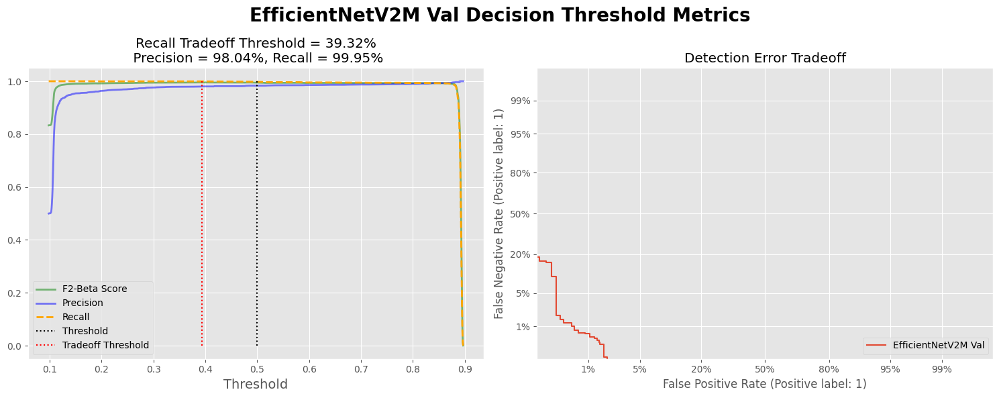

In [ ]:
EfficientNetB5SW_Val_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, EfficientNetB5SW_Val_Predictions_Probs, decisionThreshold, "EfficientNetB5SW Val")

### **Test-Time Augmentation**

In [ ]:
EfficientNetB5SW_Val_TTA_Predictions_Probs = apply_tta(EfficientNetB5SW_Model, val_data, tta_val_data, num_augmentations=5)

In [ ]:
decisionThreshold = 0.5

EfficientNetB5SW_Val_TTA_Predictions = [1 if pred > decisionThreshold else 0 for pred in EfficientNetB5SW_Val_TTA_Predictions_Probs]

EfficientNetB5SW_Val_TTA_Predictions[:5]

In [ ]:
make_classification_plots(val_data.labels, EfficientNetB5SW_Val_TTA_Predictions_Probs, decisionThreshold, "EfficientNetB5SW TTA Val")

In [ ]:
EfficientNetB5SW_Val_TTA_Best_Threshold = make_binary_classification_plots(
    val_data.labels, EfficientNetB5SW_Val_TTA_Predictions_Probs, decisionThreshold, "EfficientNetB5SW TTA Val")

In [ ]:
EfficientNetB5SW_Val_TTA_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, EfficientNetB5SW_Val_TTA_Predictions_Probs, decisionThreshold, "EfficientNetB5SW TTA Val")

# **Visualizing Predictions**

In [ ]:
val_preprocessor = ImageDataGenerator(
)

val_generator = val_preprocessor.flow_from_dataframe(
        dataframe=val_df,
        directory=Dataset_Path,
        x_col="file_name",
        y_col="label",
        class_mode="binary",
        classes=['Human','AI'],
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=True,
        batch_size=batch_size,
        seed=0
    )

Found 3998 validated image filenames belonging to 2 classes.


## **Model Predictions**

Image 1 predictions: {'Human': '11.43', 'AI': '88.57'} | Inference Time: 103.63ms
Image 2 predictions: {'Human': '89.60', 'AI': '10.40'} | Inference Time: 100.65ms
Image 3 predictions: {'Human': '89.38', 'AI': '10.62'} | Inference Time: 99.48ms
Image 4 predictions: {'Human': '10.51', 'AI': '89.49'} | Inference Time: 98.07ms
Image 5 predictions: {'Human': '10.55', 'AI': '89.45'} | Inference Time: 99.11ms
Image 6 predictions: {'Human': '10.25', 'AI': '89.75'} | Inference Time: 104.29ms
Image 7 predictions: {'Human': '89.86', 'AI': '10.14'} | Inference Time: 99.21ms
Image 8 predictions: {'Human': '9.68', 'AI': '90.32'} | Inference Time: 97.73ms
Image 9 predictions: {'Human': '89.72', 'AI': '10.28'} | Inference Time: 100.86ms
Image 10 predictions: {'Human': '89.61', 'AI': '10.39'} | Inference Time: 97.90ms


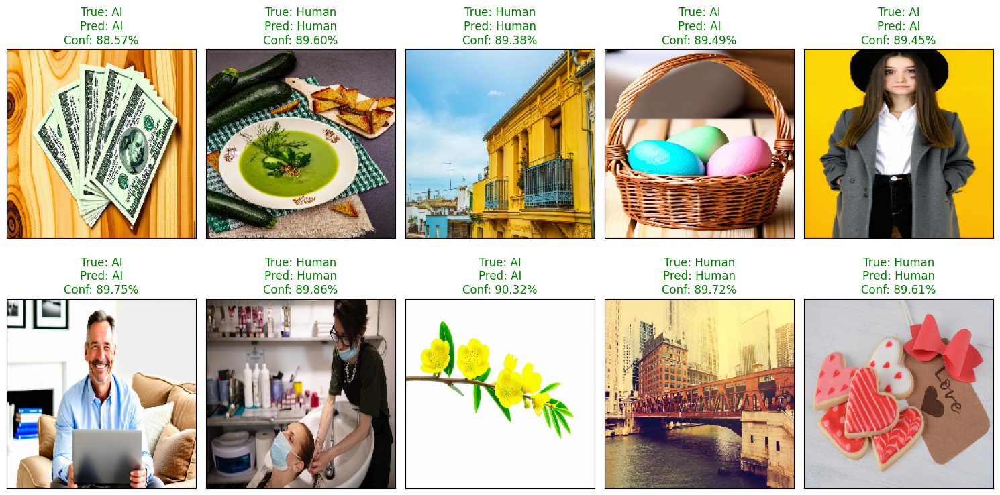


Total inference time for 10 images: 1.00 seconds.

Average inference time for 10 images: 0.10 seconds (100.09ms).


In [ ]:
display_random_predictions(val_generator, EfficientNetB5SW_Model, Classes_Labels,  rows=2, cols=5)

# **Predicting Competition Test Data**

In [ ]:
Comp_test_df

,id,file_path
0,test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
1,test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
2,test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
3,test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
4,test_data_v2/a16495c578b7494683805484ca27cf9f.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
...,...,...
5535,test_data_v2/483412064ff74d9d9472d606b65976d9.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
5536,test_data_v2/c0b49ba4081a4197b422dac7c15aea7f.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
5537,test_data_v2/01454aaedec140c0a3ca1f48028c41cf.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...
5538,test_data_v2/e9adfea8b67e4791968c4c2bdd8ec343.jpg,/kaggle/input/ai-vs-human-generated-dataset/te...


In [ ]:
comp_test_preprocessor = ImageDataGenerator(
    )

comp_test_generator = comp_test_preprocessor.flow_from_dataframe(
        dataframe=Comp_test_df,
        directory=Dataset_Path,
        x_col="file_path",
        y_col=None,
        class_mode=None,
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

Found 5540 validated image filenames.


In [ ]:
tta_comp_test_preprocessor = ImageDataGenerator(
        zoom_range=(0.9, 1.1),
        rotation_range=15,
        width_shift_range=0.1,
        height_shift_range=0.1,
        shear_range=0.1,
        horizontal_flip=True,
        vertical_flip=True,
        brightness_range=[0.8, 1.2],
        channel_shift_range=0.2,
        fill_mode='reflect',
    )

tta_comp_test_generator = comp_test_preprocessor.flow_from_dataframe(
        dataframe=Comp_test_df,
        directory=Dataset_Path,
        x_col="file_path",
        y_col=None,
        class_mode=None,
        target_size=(img_shape,img_shape),
        color_mode="rgb",
        shuffle=False,
        batch_size=batch_size,
        seed=0
    )

Found 5540 validated image filenames.


**Predicting Competition Test Data**

In [ ]:
Predictions_Probs = EfficientNetB5SW_Model.predict(comp_test_generator)

/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


87/87 ━━━━━━━━━━━━━━━━━━━━ 275s 3s/step


In [ ]:
median_threshold = np.median(Predictions_Probs)

decisionThreshold = 0.1109

CompTest_Predictions = [1 if pred > decisionThreshold else 0 for pred in Predictions_Probs]

median_threshold

0.11221949756145477

In [ ]:
len(CompTest_Predictions)

5540

**Making Submission**

In [ ]:
submission_df = pd.DataFrame({
    'id': Comp_test_df['id'],
    'label': CompTest_Predictions
})

submission_df.to_csv('submission.csv', index=False)

print(submission_df.head())

                                                  id  label
0  test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg      1
1  test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg      0
2  test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg      0
3  test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg      0
4  test_data_v2/a16495c578b7494683805484ca27cf9f.jpg      1


In [ ]:
submission_df['label'].value_counts()

label
1    2894
0    2646
Name: count, dtype: int64

In [ ]:
TTA_Predictions_Probs = apply_tta(EfficientNetV2M_Model, comp_test_generator, tta_comp_test_generator, num_augmentations=5)

87/87 ━━━━━━━━━━━━━━━━━━━━ 176s 2s/step


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


87/87 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step
87/87 ━━━━━━━━━━━━━━━━━━━━ 173s 2s/step
87/87 ━━━━━━━━━━━━━━━━━━━━ 171s 2s/step
87/87 ━━━━━━━━━━━━━━━━━━━━ 172s 2s/step


In [ ]:
median_threshold = np.median(TTA_Predictions_Probs)

decisionThreshold = 0.1105

TTA_CompTest_Predictions = [1 if pred > decisionThreshold else 0 for pred in TTA_Predictions_Probs]

# median_threshold

In [ ]:
len(TTA_CompTest_Predictions)

**Making Submission**

In [ ]:
submission_df = pd.DataFrame({
    'id': Comp_test_df['id'],
    'label': TTA_CompTest_Predictions
})

submission_df.to_csv('submission.csv', index=False)

print(submission_df.head())

                                                  id  label
0  test_data_v2/1a2d9fd3e21b4266aea1f66b30aed157.jpg      1
1  test_data_v2/ab5df8f441fe4fbf9dc9c6baae699dc7.jpg      1
2  test_data_v2/eb364dd2dfe34feda0e52466b7ce7956.jpg      0
3  test_data_v2/f76c2580e9644d85a741a42c6f6b39c0.jpg      0
4  test_data_v2/a16495c578b7494683805484ca27cf9f.jpg      1


In [ ]:
submission_df['label'].value_counts()

label
0    2803
1    2737
Name: count, dtype: int64

# **ONNX Conversion**

## **Model Conversion**

In [ ]:
# Create a new input layer with the same shape as the original input
new_input = tf.keras.layers.Input(shape=(img_shape, img_shape, color_type), name='new_input')

# Start with the new input
x = new_input

# Loop through the layers, skipping the augmentation_pipeline
for layer in EfficientNetB5SW_Model.layers[1:]:
    if layer.name == 'augmentation_pipeline':
        continue  # Skip the input layer and augmentation pipeline
    x = layer(x)  # Pass the output of the previous layer as input to the current layer

# Create the new inference model
Inference_model = tf.keras.Model(inputs=new_input, outputs=x, name='inference_model')
Inference_model.summary()

Model: "inference_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ new_input (InputLayer)               │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ modified_preprocessor (Sequential)   │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ efficient_net_backbone               │ (None, 7, 7, 2048)          │      28,513,520 │
│ (EfficientNetBackbone)               │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_15               │ (None, 7, 7, 2048)          │           8,192 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ spatial_dropout2d_3                  │ (None, 7, 7, 2048)          │               0 │
│ (SpatialDropout2D)                   │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_3           │ (None, 2048)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 512)                 │       1,049,088 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_16               │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_16 (Dense)                     │ (None, 512)                 │         262,656 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_17               │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_5 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_17 (Dense)                     │ (None, 256)                 │         131,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_18               │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_18 (Dense)                     │ (None, 256)                 │          65,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_19               │ (None, 256)                 │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 30,036,977 (114.58 MB)

 Trainable params: 27,864,065 (106.29 MB)

 Non-trainable params: 2,172,912 (8.29 MB)

In [ ]:
EfficientNetB5SW_Model.save('EfficientNetB5SW.keras') # 345 MB

In [ ]:
# Convert the model to ONNX format

import tf2onnx
import onnxruntime

# Adjust the shape (None, height, width, channels) as needed.
spec = (tf.TensorSpec((None, img_shape, img_shape, color_type), tf.float32, name="input"),)

# Use tf2onnx.convert.from_keras with the input_signature argument.
model_proto, external_tensor_storage = tf2onnx.convert.from_keras(
    Inference_model,
    input_signature=spec,
    opset=13,
    output_path="model.onnx"
)

## **ONNX Model Testing**

In [ ]:
# Initialize the ONNX runtime session once at startup
# Create session options with optimizations
session_options = onnxruntime.SessionOptions()
session_options.graph_optimization_level = onnxruntime.GraphOptimizationLevel.ORT_ENABLE_ALL
session_options.enable_mem_pattern = True
session_options.enable_cpu_mem_arena = True

# Initialize optimized session
session = onnxruntime.InferenceSession(
    'model.onnx',
    sess_options=session_options,
    providers=['CPUExecutionProvider']
)

In [ ]:
def load_prep_image(filename, img_shape=224):
    try:
        # Load the image and convert to RGB
        img = Image.open(filename).convert('RGB')

        # Resize to the target shape using bilinear interpolation
        img = img.resize((img_shape, img_shape), resample=Image.BILINEAR)

        # Convert to a NumPy array with uint8 type
        img_array = np.array(img, dtype='float32')

        # Add batch dimension (shape becomes (1, img_shape, img_shape, 3))
        img_array = np.expand_dims(img_array, axis=0)

        return img_array
    except Exception as e:
        print(f"Error loading image: {e}")
        return None

In [ ]:
def predict_new_img_onnx(filename, decision_threshold=0.5):
    """
    Loads an image file, preprocesses it, runs inference using an ONNX model,
    and returns the predicted class and its confidence.
    """
    # Load and preprocess the image (using your existing load_prep_image function)
    preprocessed_img = load_prep_image(filename)

    # Retrieve the input name for the ONNX model
    input_name = session.get_inputs()[0].name

    # Run the model inference using the preprocessed image
    model_pred_probs = session.run(None, {input_name: preprocessed_img})

    # Assumes the prediction output is in the first element and index [0][0]
    prob = model_pred_probs[0][0][0]

    # Determine class and confidence based on the decision threshold
    if prob > decision_threshold:
        pred_class = Classes_Labels[1]  # e.g., "AI"
        confidence = round(prob * 100, 2)
    else:
        pred_class = Classes_Labels[0]  # e.g., "Human"
        confidence = round((1 - prob) * 100, 2)

    return pred_class, confidence, prob

In [ ]:
onnx_pred_classes = []
onnx_pred_confidences = []
onnx_pred_prob = np.array([])


for filepath in tqdm(comp_test_generator.filenames, desc="Predicting"):
    pred_class , confidence, prob = predict_new_img_onnx(filepath)

    onnx_pred_classes.append(pred_class)
    onnx_pred_confidences.append(float(confidence))
    onnx_pred_prob = np.append(onnx_pred_prob, prob)

Predicting: 100%|██████████| 5540/5540 [18:25<00:00,  5.01it/s]


In [ ]:
Predictions_Probs = onnx_pred_prob

In [ ]:
onnx_pred_classes = []
onnx_pred_confidences = []
onnx_pred_prob = np.array([])


for filepath in tqdm(val_data.filenames, desc="Predicting"):
    pred_class , confidence, prob = predict_new_img_onnx(filepath)

    onnx_pred_classes.append(pred_class)
    onnx_pred_confidences.append(float(confidence))
    onnx_pred_prob = np.append(onnx_pred_prob, prob)

Predicting: 100%|██████████| 3998/3998 [13:10<00:00,  5.06it/s]


In [ ]:
print(onnx_pred_classes[:5])
print(onnx_pred_confidences[:5])
print(onnx_pred_prob[:5])

['AI', 'Human', 'AI', 'Human', 'AI']
[89.17, 89.67, 89.0, 80.96, 89.57]
[0.89166546 0.10328421 0.88996184 0.19037956 0.895666  ]


[Metrics Summary]
Accuracy = 99.05% | Balanced Accuracy = 99.05% | Precision = 99.06% | Recall = 99.05% | F1-Score = 99.05% | F-Beta Score = 99.05% | AUC Score = 99.92% | Average Precision = 99.91%


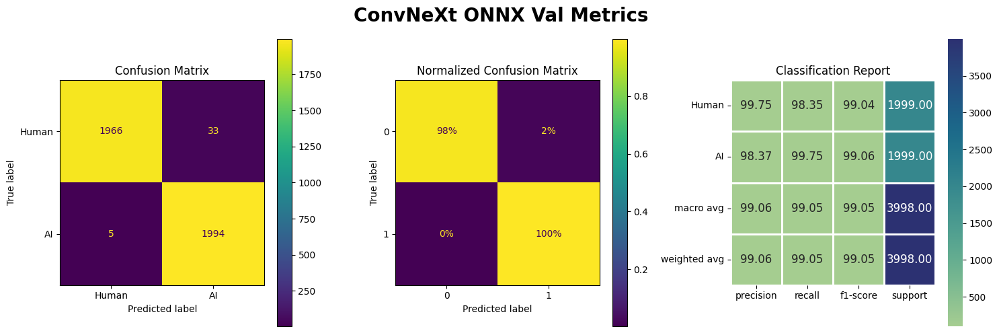


 ConvNeXt ONNX Val Classification Report: 
               precision    recall  f1-score   support

       Human       1.00      0.98      0.99      1999
          AI       0.98      1.00      0.99      1999

    accuracy                           0.99      3998
   macro avg       0.99      0.99      0.99      3998
weighted avg       0.99      0.99      0.99      3998



In [ ]:
make_classification_plots(val_data.labels, onnx_pred_prob, 0.50, "ConvNeXt ONNX Val")

[Positive Class Metrics Summary]
Precision = 98.37% | Recall = 99.75% | F1-Score = 99.06% | F-Beta Score = 99.47% | AUC Micro Score = 99.92%


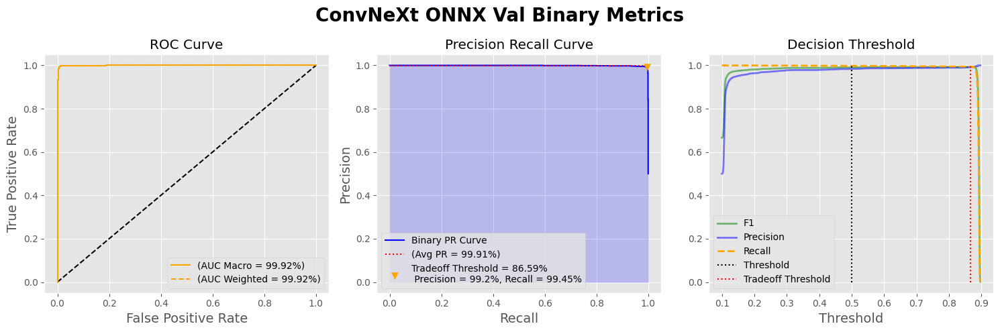

In [ ]:
ConvNeXt_Val_Best_Threshold = make_binary_classification_plots(
    val_data.labels, onnx_pred_prob, 0.50, "ConvNeXt ONNX Val")

,samples,micro,macro,weighted
AUC,99.920000,99.920000,99.920000,99.920000
mAP,99.910000,99.910000,99.910000,99.910000


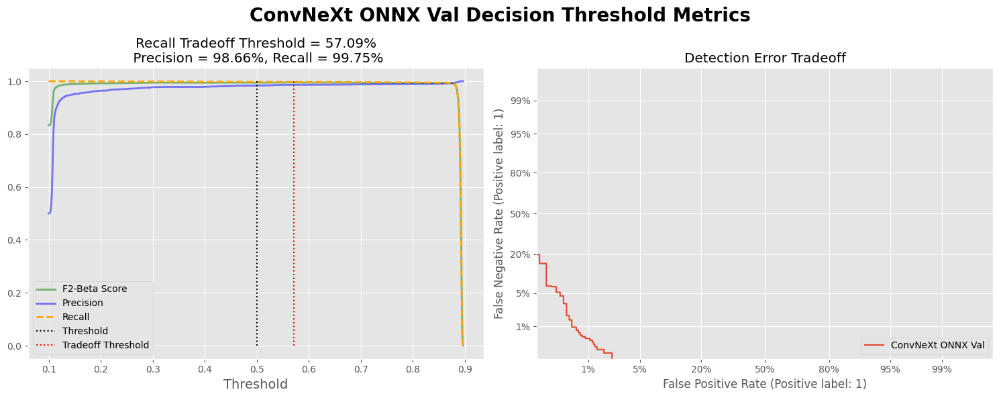

In [ ]:
ConvNeXt_Val_BestRecall_Threshold = make_binary_threshold_plots(
    val_data.labels, onnx_pred_prob, 0.50, "ConvNeXt ONNX Val")